In [1]:
import numpy as np
import trimesh
import moderngl
import pygame
import sys
from pygame.locals import *
from OpenGL.GL import *
from OpenGL.GLU import *

def load_and_check_mesh(mesh_path):
    """Load mesh and print information about it"""
    print(f"\nLoading mesh from: {mesh_path}")
    scene = trimesh.load(mesh_path)
    
    if isinstance(scene, trimesh.Scene):
        print("\nLoaded a scene with multiple geometries:")
        for name, geometry in scene.geometry.items():
            print(f"\nGeometry: {name}")
            print(f"Vertices: {len(geometry.vertices)}")
            print(f"Faces: {len(geometry.faces)}")
            print(f"Bounds: {geometry.bounds}")
            mesh = scene.geometry['geometry_0']
    else:
        print("\nLoaded a single mesh:")
        print(f"Vertices: {len(scene.vertices)}")
        print(f"Faces: {len(scene.faces)}")
        print(f"Bounds: {scene.bounds}")
        mesh = scene
    
    # Check if mesh is centered
    center = mesh.vertices.mean(axis=0)
    print(f"\nMesh center: {center}")
    print(f"Mesh bounds: {mesh.bounds}")
    
    return mesh

class MeshViewer:
    def __init__(self, mesh, width=800, height=600):
        self.mesh = mesh
        self.width = width
        self.height = height
        
        # Initialize Pygame and OpenGL
        pygame.init()
        pygame.display.set_mode((width, height), DOUBLEBUF | OPENGL)
        
        # Set up ModernGL context
        self.ctx = moderngl.create_context()
        
        # Create shader program
        self.prog = self.ctx.program(
            vertex_shader='''
                #version 330
                in vec3 in_position;
                uniform mat4 mvp;
                void main() {
                    gl_Position = mvp * vec4(in_position, 1.0);
                }
            ''',
            fragment_shader='''
                #version 330
                out vec4 fragColor;
                void main() {
                    fragColor = vec4(0.8, 0.8, 0.8, 1.0);  // Light gray color
                }
            '''
        )
        
        # Create vertex and index buffers
        vertices = self.mesh.vertices.astype('f4')
        indices = self.mesh.faces.astype('i4')
        
        self.vbo = self.ctx.buffer(vertices.tobytes())
        self.ibo = self.ctx.buffer(indices.tobytes())
        
        # Create vertex array
        self.vao = self.ctx.vertex_array(
            self.prog,
            [(self.vbo, '3f', 'in_position')],
            self.ibo
        )
        
        # Set up projection matrix
        self.fov = 45.0
        self.near = 0.1
        self.far = 100.0
        self.aspect_ratio = width / height
        
        # Camera parameters
        self.camera_distance = 5.0
        self.camera_rotation = [0, 0]  # [horizontal, vertical]
        
    def get_projection_matrix(self):
        f = 1.0 / np.tan(np.radians(self.fov) / 2)
        return np.array([
            [f/self.aspect_ratio, 0.0, 0.0, 0.0],
            [0.0, f, 0.0, 0.0],
            [0.0, 0.0, (self.far+self.near)/(self.near-self.far), (2*self.far*self.near)/(self.near-self.far)],
            [0.0, 0.0, -1.0, 0.0]
        ], dtype='f4')
    
    def get_view_matrix(self):
        # Calculate camera position
        theta = np.radians(self.camera_rotation[0])
        phi = np.radians(self.camera_rotation[1])
        
        camera_pos = np.array([
            self.camera_distance * np.sin(theta) * np.cos(phi),
            self.camera_distance * np.sin(phi),
            self.camera_distance * np.cos(theta) * np.cos(phi)
        ])
        
        # Look at center
        target = np.zeros(3)
        up = np.array([0, 1, 0])
        
        # Calculate view matrix
        z = camera_pos - target
        z = z / np.linalg.norm(z)
        
        x = np.cross(up, z)
        x = x / np.linalg.norm(x)
        
        y = np.cross(z, x)
        
        view = np.eye(4, dtype='f4')
        view[:3, 0] = x
        view[:3, 1] = y
        view[:3, 2] = z
        view[:3, 3] = camera_pos
        
        return np.linalg.inv(view)
    
    def run(self):
        clock = pygame.time.Clock()
        
        while True:
            for event in pygame.event.get():
                if event.type == pygame.QUIT:
                    pygame.quit()
                    return
                elif event.type == pygame.MOUSEMOTION:
                    if event.buttons[0]:  # Left mouse button
                        self.camera_rotation[0] += event.rel[0]
                        self.camera_rotation[1] = max(-89, min(89, self.camera_rotation[1] + event.rel[1]))
                elif event.type == pygame.MOUSEWHEEL:
                    self.camera_distance = max(2, min(20, self.camera_distance - event.y))
            
            # Clear screen
            self.ctx.clear(0.2, 0.2, 0.2)
            self.ctx.enable(moderngl.DEPTH_TEST)
            
            # Calculate MVP matrix
            proj = self.get_projection_matrix()
            view = self.get_view_matrix()
            mvp = proj @ view
            
            # Update uniform and render
            self.prog['mvp'].write(mvp.tobytes())
            self.vao.render(moderngl.LINES)  # Use LINES for wireframe view
            
            pygame.display.flip()
            clock.tick(60)

def main():
    mesh_path = "/home/link/Downloads/sample.glb"  # Update this path
    
    # Load and check mesh
    mesh = load_and_check_mesh(mesh_path)
    
    # Create and run viewer
    viewer = MeshViewer(mesh)
    viewer.run()

if __name__ == "__main__":
    main()

ModuleNotFoundError: No module named 'pygame'

## Visualise 3d Object

Mesh with Camera Positions
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(19986, 3), faces.shape=(35776, 3))>)])


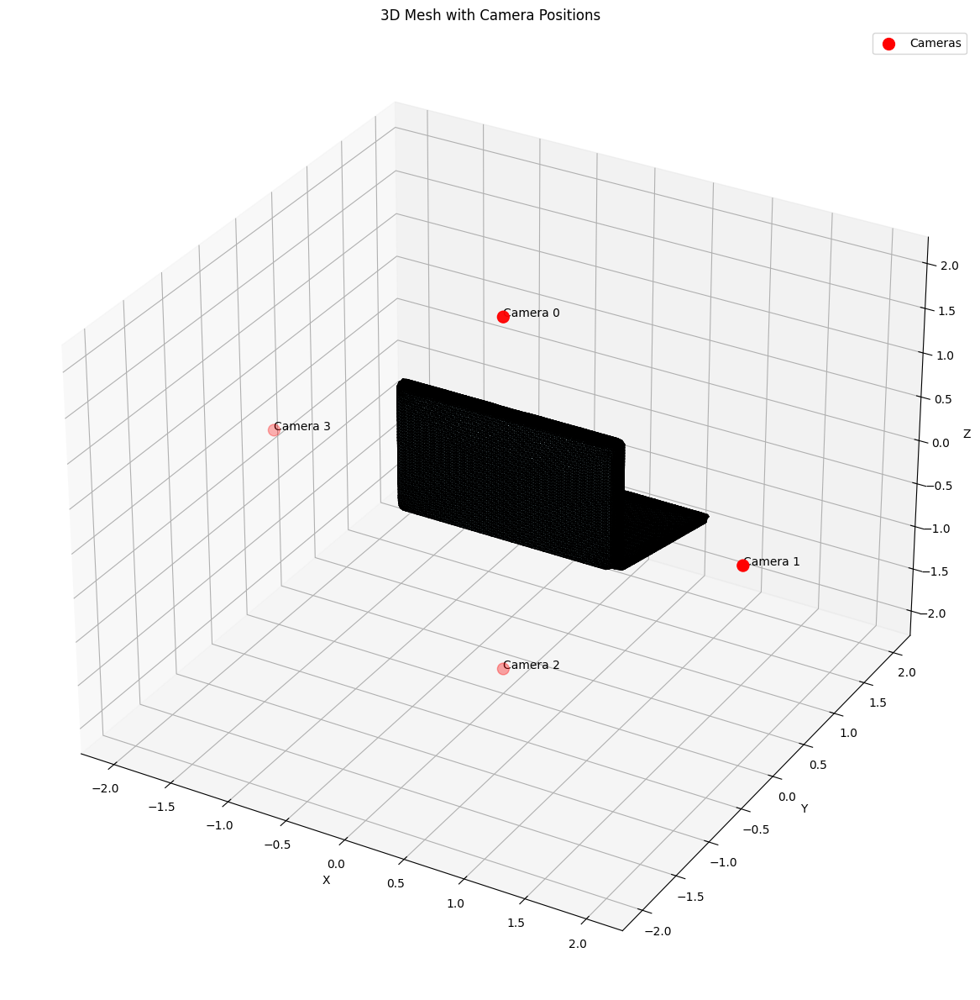

In [2]:
import trimesh
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def visualize_cameras_vscode(mesh_path, part_name):
    """
    Visualize mesh with camera positions
    """
    # Load the mesh
    scene = trimesh.load(mesh_path)
    if isinstance(scene, trimesh.Scene):
        print(scene.geometry)
        # mesh = scene.geometry['geometry_0']
        # mesh = scene.geometry['laptop_real.glb']
        mesh = scene.geometry[part_name]
    else:
        mesh = scene
    
    # Create figure
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Get mesh vertices and faces
    vertices = mesh.vertices
    faces = mesh.faces
    
    # Create triangles for visualization
    triangles = vertices[faces]
    
    # Plot the triangles
    ax.add_collection3d(Poly3DCollection(
        triangles,
        facecolor='lightblue',
        edgecolor='black',
        alpha=0.3
    ))
    
    # Create camera positions
    distance = 2.0
    angles = [0, 90, 180, 270]  # degrees
    camera_positions = []
    
    for angle in angles:
        theta = np.radians(angle)
        cam_pos = np.array([
            distance * np.sin(theta),
            0,
            distance * np.cos(theta)
        ])
        camera_positions.append(cam_pos)
    
    camera_positions = np.array(camera_positions)
    
    # Plot camera positions
    ax.scatter(
        camera_positions[:, 0],
        camera_positions[:, 1],
        camera_positions[:, 2],
        c='red',
        s=100,
        label='Cameras'
    )
    
    # Add camera labels
    for i, pos in enumerate(camera_positions):
        ax.text(pos[0], pos[1], pos[2], f'Camera {i}')
    
    # Auto-scale the axes
    scale = np.concatenate([vertices.flatten(), camera_positions.flatten()])
    ax.auto_scale_xyz(scale, scale, scale)
    
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.title('3D Mesh with Camera Positions')
    
    # Add legend
    ax.legend()
    plt.tight_layout()
    plt.show()

# Example usage
# mesh_path = "/home/link/Downloads/sample.glb"  # Update this path
mesh_path = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/segmented_mesh_the movable screen part.glb"
part_name = 'geometry_0'
# In first cell
# print("Mesh Visualization")
# visualize_mesh_vscode(mesh_path)

# In second cell
print("Mesh with Camera Positions")
visualize_cameras_vscode(mesh_path, part_name)

Mesh with Camera Positions
OrderedDict([('laptop_real.glb', <trimesh.Trimesh(vertices.shape=(19986, 3), faces.shape=(35776, 3))>)])


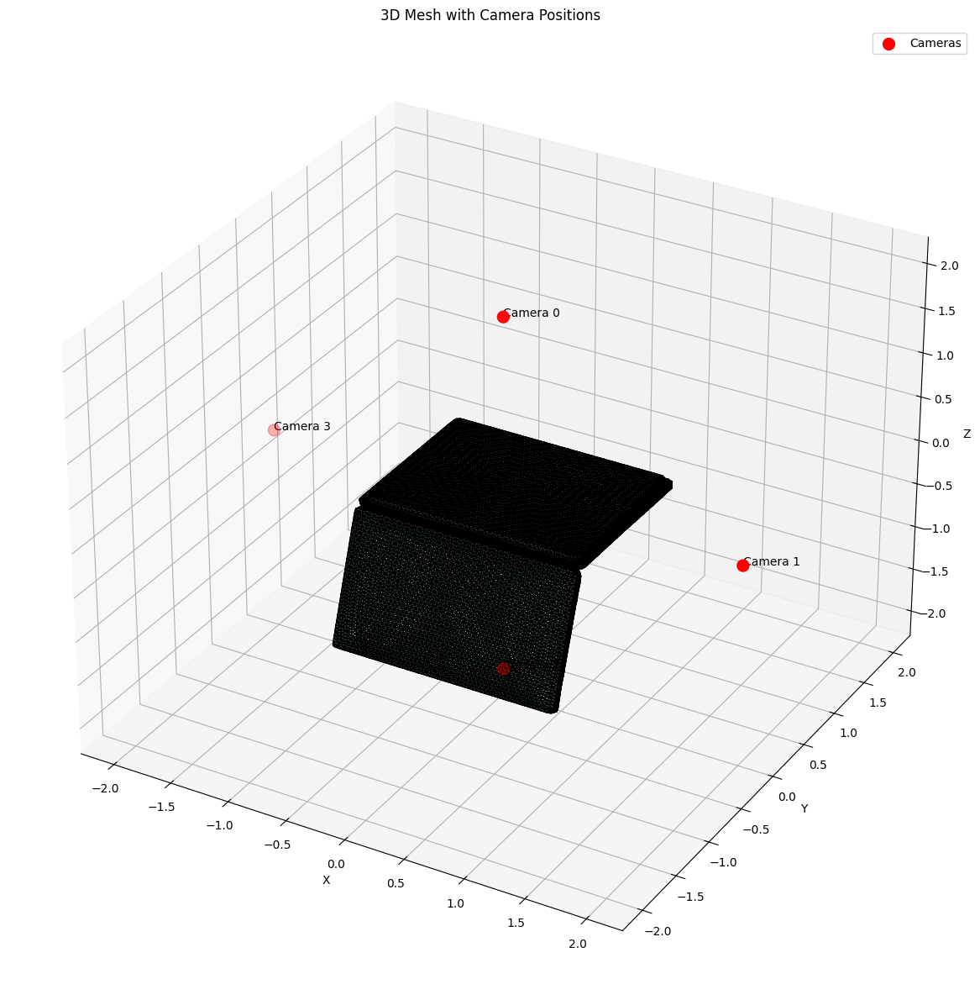

In [8]:
mesh_path = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/segmented_mesh_movable screen part.glb"
part_name = 'laptop_real.glb'

print("Mesh with Camera Positions")
visualize_cameras_vscode(mesh_path, part_name)

Mesh with Camera Positions
OrderedDict([('laptop_real.glb', <trimesh.Trimesh(vertices.shape=(19986, 3), faces.shape=(35776, 3))>)])


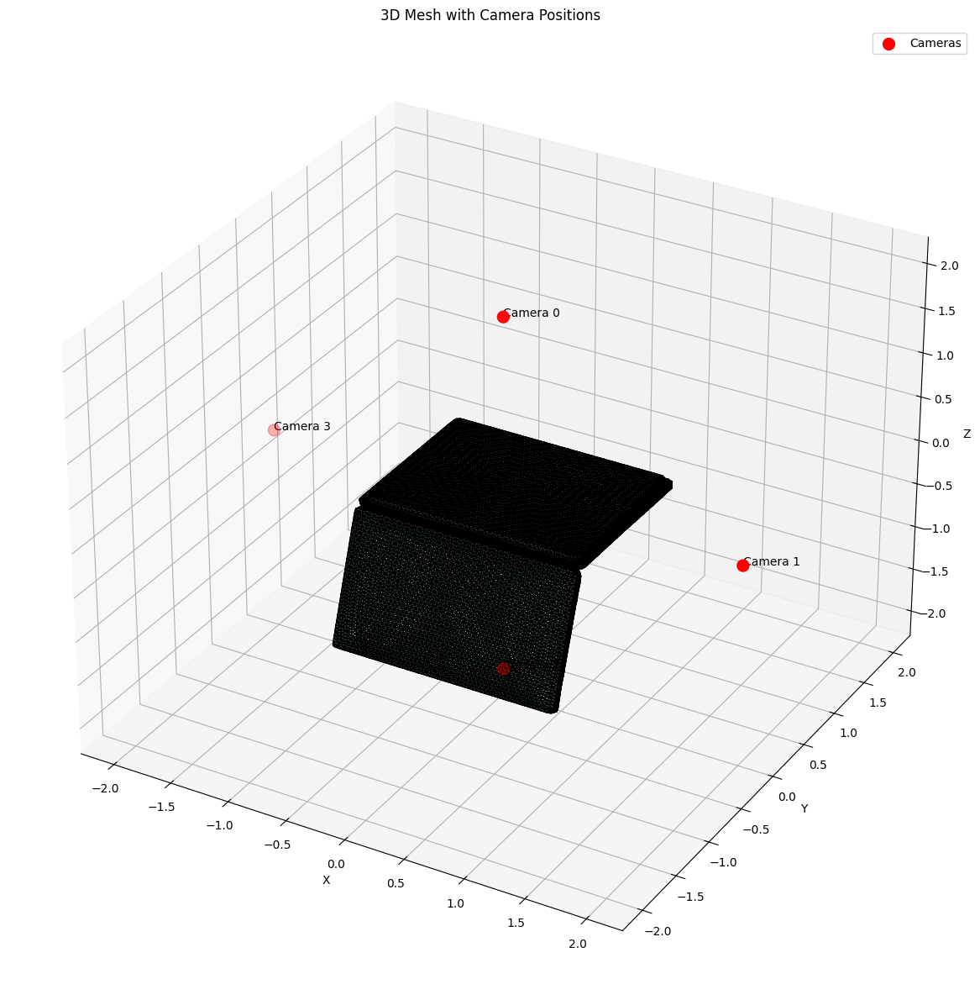

In [9]:
mesh_path = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/segmented_mesh.glb"
part_name = 'laptop_real.glb'

print("Mesh with Camera Positions")
visualize_cameras_vscode(mesh_path, part_name)

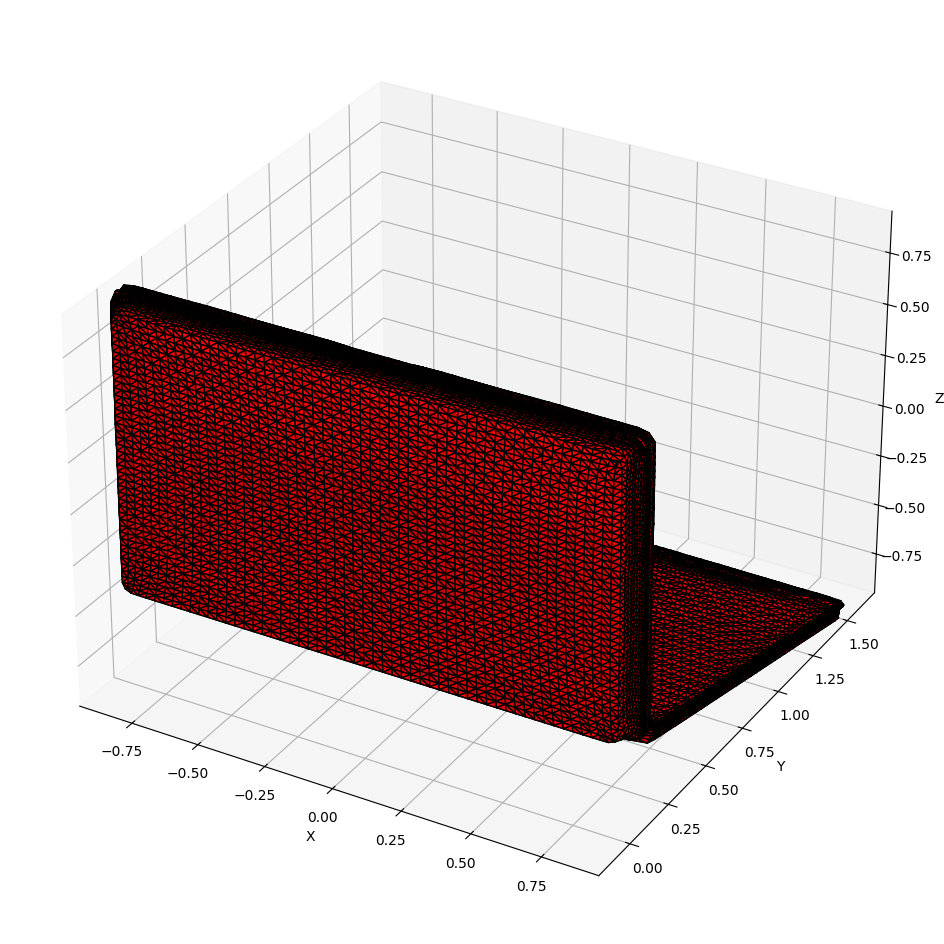

In [15]:
def visualize_cameras_vscode(mesh_path):
    """
    Visualize mesh with camera positions and segmentation colors
    """
    # Load the mesh
    scene = trimesh.load(mesh_path)
    if isinstance(scene, trimesh.Scene):
        # Get the first mesh from the scene
        mesh = list(scene.geometry.values())[0]
    else:
        mesh = scene
    
    # Create figure
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Get mesh vertices, faces and colors
    vertices = mesh.vertices
    faces = mesh.faces
    
    # Check if vertex colors exist
    if hasattr(mesh, 'visual') and hasattr(mesh.visual, 'vertex_colors'):
        # Get vertex colors and normalize to [0,1]
        colors = mesh.visual.vertex_colors[:, :3] / 255.0
        # Get face colors by averaging vertex colors
        face_colors = colors[faces].mean(axis=1)
    else:
        print("Warning: No vertex colors found in mesh")
        face_colors = np.ones((len(faces), 3)) * 0.8  # Default gray
    
    # Create triangles for visualization
    triangles = vertices[faces]
    
    # Plot the triangles with their colors
    ax.add_collection3d(Poly3DCollection(
        triangles,
        facecolors=face_colors,
        edgecolor='black',
        alpha=0.8
    ))
    
    # Fix the orientation if needed
    # Option 1: Rotate 180 degrees around X axis
    # vertices = np.dot(vertices, np.array([[1, 0, 0], [0, -1, 0], [0, 0, -1]]))
    # Option 2: Rotate 180 degrees around Y axis
    # vertices = np.dot(vertices, np.array([[-1, 0, 0], [0, 1, 0], [0, 0, -1]]))
    
    # Set axis limits based on mesh bounds
    bounds = np.array([vertices.min(axis=0), vertices.max(axis=0)])
    center = bounds.mean(axis=0)
    max_range = (bounds[1] - bounds[0]).max() / 2
    
    ax.set_xlim(center[0] - max_range, center[0] + max_range)
    ax.set_ylim(center[1] - max_range, center[1] + max_range)
    ax.set_zlim(center[2] - max_range, center[2] + max_range)
    
    # Set labels
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    plt.show()


mesh_path = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/segmented_mesh_the movable screen part.glb"
visualize_cameras_vscode(mesh_path)

## Visualise RGB images

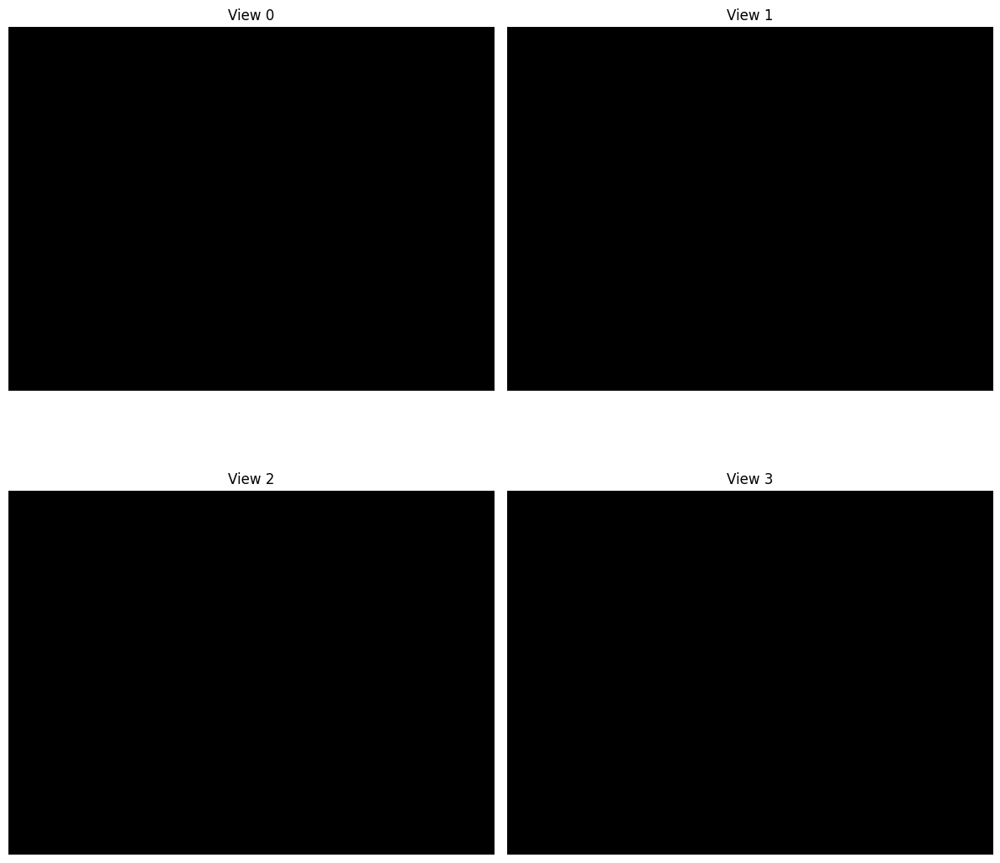

In [3]:
def visualize_generated_views(input_dir):
    """
    Display the generated views in the notebook
    """
    import matplotlib.pyplot as plt
    import cv2
    import os
    
    # Get all RGB views
    rgb_files = sorted([f for f in os.listdir(input_dir) if f.endswith('_rgb.png')])
    n_views = len(rgb_files)
    
    if n_views == 0:
        print("No view files found!")
        return
    
    # Create subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes = axes.ravel()
    
    for idx, filename in enumerate(rgb_files):
        if idx >= 4:  # Only show first 4 views
            break
            
        filepath = os.path.join(input_dir, filename)
        img = cv2.imread(filepath)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[idx].imshow(img)
            axes[idx].set_title(f'View {idx}')
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
input_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/output_views"  # Update this path
visualize_generated_views(input_dir)

## Visualise Depth images

Found 4 depth files

Depth statistics for view 0:
Min depth: 0
Max depth: 0
Mean depth: 0.00

Depth statistics for view 1:
Min depth: 0
Max depth: 65535
Mean depth: 211.62

Depth statistics for view 2:
Min depth: 0
Max depth: 0
Mean depth: 0.00

Depth statistics for view 3:
Min depth: 0
Max depth: 65535
Mean depth: 211.62


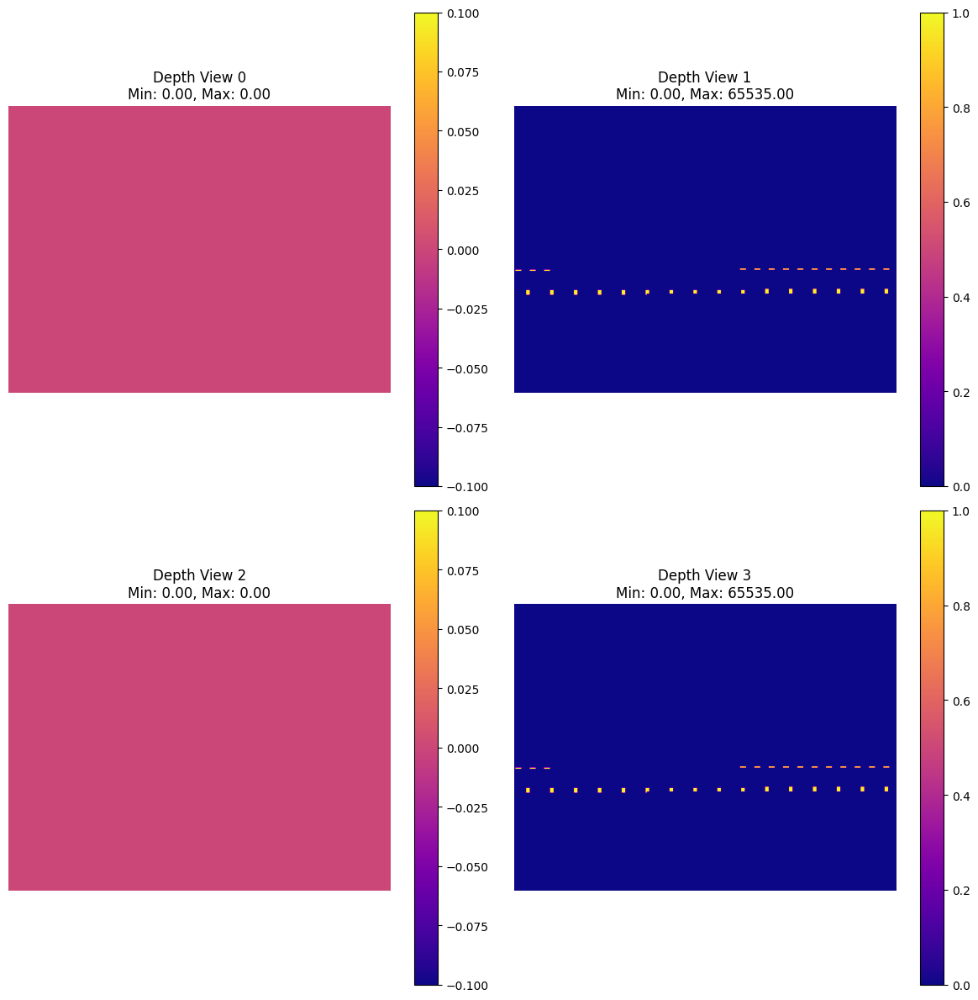

In [4]:
import os
import cv2

def visualize_depth_images(input_dir, num_views=4):
    """
    Visualize depth images in a grid
    
    Args:
        input_dir: Directory containing the depth images
        num_views: Number of views to display
    """
    # Get all depth files
    depth_files = sorted([f for f in os.listdir(input_dir) if f.endswith('_depth.png')])
    
    print(f"Found {len(depth_files)} depth files")
    
    # Create subplot grid
    rows = (num_views + 1) // 2  # Calculate rows needed
    cols = min(2, num_views)     # Maximum 2 columns
    fig, axes = plt.subplots(rows, cols, figsize=(12, 6*rows))
    
    # Convert axes to 2D array if it's 1D
    if num_views <= 2:
        axes = np.array([axes]).reshape(1, -1)
    
    # Flatten axes for easier indexing
    axes_flat = axes.flatten()
    
    for idx in range(num_views):
        if idx < len(depth_files):
            # Load depth image
            depth_path = os.path.join(input_dir, depth_files[idx])
            depth_img = cv2.imread(depth_path, cv2.IMREAD_UNCHANGED)  # Read 16-bit depth image
            
            if depth_img is not None:
                # Normalize depth for visualization
                depth_min = np.min(depth_img)
                depth_max = np.max(depth_img)
                if depth_max > depth_min:
                    depth_normalized = (depth_img - depth_min) / (depth_max - depth_min)
                else:
                    depth_normalized = depth_img
                
                # Display depth image with colormap
                depth_display = axes_flat[idx].imshow(depth_normalized, cmap='plasma')
                axes_flat[idx].set_title(f'Depth View {idx}\nMin: {depth_min:.2f}, Max: {depth_max:.2f}')
                
                # Add colorbar
                plt.colorbar(depth_display, ax=axes_flat[idx])
                
                # Print depth statistics
                print(f"\nDepth statistics for view {idx}:")
                print(f"Min depth: {depth_min}")
                print(f"Max depth: {depth_max}")
                print(f"Mean depth: {np.mean(depth_img):.2f}")
            else:
                print(f"Failed to load depth image: {depth_path}")
                axes_flat[idx].text(0.5, 0.5, 'Failed to load image', 
                                  horizontalalignment='center',
                                  verticalalignment='center')
            
            # Turn off axis labels
            axes_flat[idx].axis('off')
    
    # Remove empty subplots if any
    for idx in range(len(depth_files), len(axes_flat)):
        fig.delaxes(axes_flat[idx])
    
    plt.tight_layout()
    plt.show()

# Example usage
input_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/output_views"  # Update this path
visualize_depth_images(input_dir)

## Visualize RGB input views and segmentations

Found 4 RGB files: ['view_0_rgb.png', 'view_1_rgb.png', 'view_2_rgb.png', 'view_3_rgb.png']
Found 4 mask files: ['view_0_rgb_vis.jpg', 'view_1_rgb_vis.jpg', 'view_2_rgb_vis.jpg', 'view_3_rgb_vis.jpg']


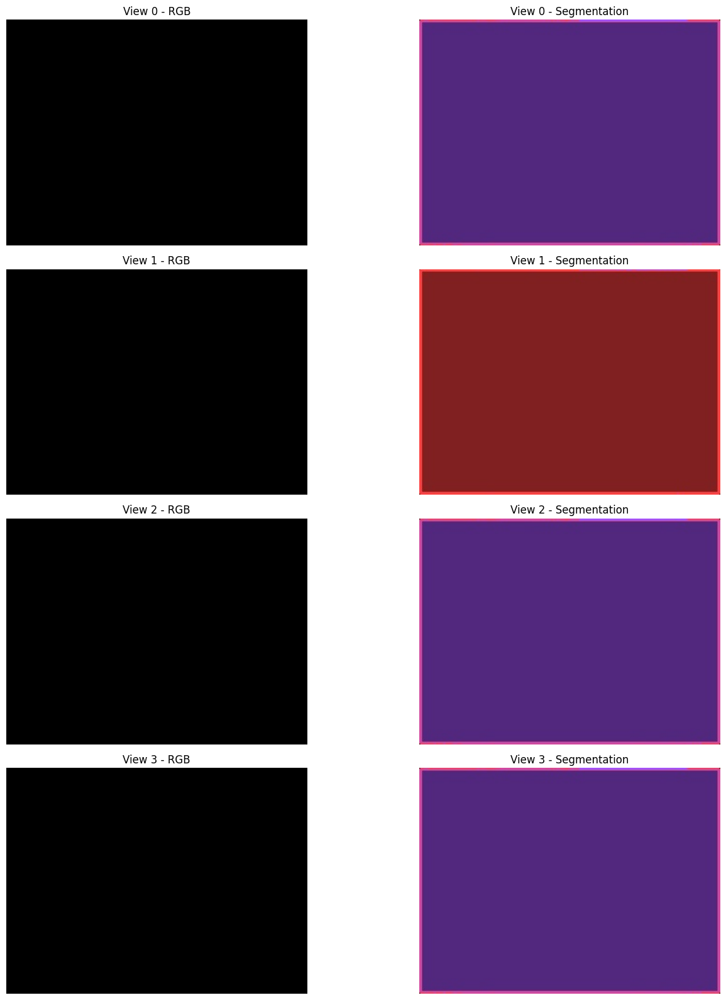

In [5]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

def visualize_results(input_dir, mask_dir, num_views=4):
    """
    Visualize RGB inputs and segmentation masks side by side
    """
    # List and sort files
    rgb_files = sorted([f for f in os.listdir(input_dir) if f.endswith('_rgb.png')])
    mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('_rgb_vis.jpg')])
    
    # Print debug information
    print(f"Found {len(rgb_files)} RGB files: {rgb_files}")
    print(f"Found {len(mask_files)} mask files: {mask_files}")
    
    # Determine actual number of views to display
    actual_views = min(num_views, len(rgb_files), len(mask_files))
    if actual_views == 0:
        print("No matching files found to display")
        return
    
    # Create a figure with subplots
    fig, axes = plt.subplots(actual_views, 2, figsize=(15, 4*actual_views))
    
    # Handle case where there's only one view
    if actual_views == 1:
        axes = axes.reshape(1, -1)
    
    for idx in range(actual_views):
        try:
            # Load RGB image
            rgb_path = os.path.join(input_dir, rgb_files[idx])
            rgb_img = cv2.imread(rgb_path)
            if rgb_img is None:
                print(f"Failed to load RGB image: {rgb_path}")
                continue
            rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
            
            # Load visualization mask
            mask_path = os.path.join(mask_dir, rgb_files[idx].replace('_rgb.png', '_rgb_vis.jpg'))
            mask_img = cv2.imread(mask_path)
            if mask_img is None:
                print(f"Failed to load mask: {mask_path}")
                continue
            mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2RGB)
            
            # Plot RGB image
            axes[idx, 0].imshow(rgb_img)
            axes[idx, 0].set_title(f'View {idx} - RGB')
            axes[idx, 0].axis('off')
            
            # Plot mask visualization
            axes[idx, 1].imshow(mask_img)
            axes[idx, 1].set_title(f'View {idx} - Segmentation')
            axes[idx, 1].axis('off')
            
        except Exception as e:
            print(f"Error processing view {idx}: {str(e)}")
            continue
    
    plt.tight_layout()
    plt.show()

# Example usage
input_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/output_views"
mask_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks"
visualize_results(input_dir, mask_dir)

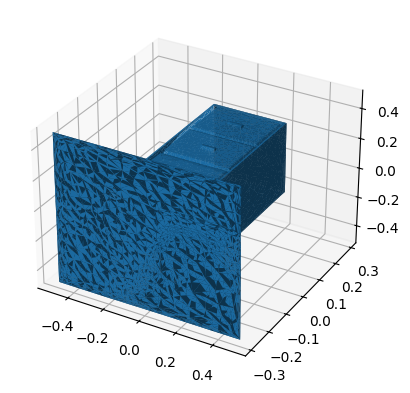

In [6]:
import trimesh
import matplotlib.pyplot as plt

scene = trimesh.load("/home/link/Downloads/sample.glb")
geometries = list(scene.geometry.values())
trim = geometries[0]


fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.plot_trisurf(trim.vertices[:, 0], trim.vertices[:,1], trim.vertices[:,2], triangles=trim.faces);

In [7]:
import numpy as np

In [8]:
import trimesh
scene = trimesh.load("/home/link/Downloads/sample.glb")
geometries = list(scene.geometry.values())
mesh = geometries[0]
# mesh = Mesh(np.float32(trim.vertices), trim.faces)
mesh = [mesh.vertices, mesh.faces, None]

# mesh = mesh_from_ply(file)
print("Faces: {}".format(mesh[1].shape))
print("Vertices: {}".format(mesh[0].shape))

Faces: (13344, 3)
Vertices: (8252, 3)


In [9]:
def get_camera_matrix(fx, fy, cx, cy, skew=0):
    """
    Initialize a camera matrix according to intrinsic parameters.
    :param fx:          Horizontal focal length (in px)
    :param fy:          Vertical focal length (in px)
    :param cx:          Horizontal principal point offset (in px)
    :param cy:          Vertical principal point offset (in px)
    :param skew:        (opt.) Axis skew factor
    :return:            Camera matrix
    """
    # Camera matrix:
    K = np.identity(3)
    K[0, 0] = fx
    K[1, 1] = fy
    K[0, 2] = cx
    K[1, 2] = cy
    K[0, 1] = skew
    return K


# microsoft Kinect camera
fx, fy = 572.4114, 573.5704   # Focal lengths
cx, cy = 325.2611, 242.0489   # Central point
image_size = (640, 480)       # Image size

camera_matrix = get_camera_matrix(fx, fy, cx, cy)


camera_position = np.ones(3)
camera_rotation_matrix = np.zeros((3, 3))


image_size = (640, 480)

clip_near = 0.001
clip_far = 100.0

background_color = (.0, .0, .0) # black

In [10]:
def convert_hz_intrinsic_to_opengl_projection(K, x0, y0, width, height, znear, zfar, flipy=False):
    """
    Convert camera parameter (Hartley-Zisserman intrinsic matrix) into a projection matrix for OpenGL.
    Snippet by Andrew Straw
    (https://gist.github.com/astraw/1341472/c5f8aba7f81431967d1fc9d954ae20822c616c17#file-calib_test_utils-py-L67)
    :param K:       Camera matrix
    :param x0:      Camera horizontal image origin (typically 0)
    :param y0:      Camera vertical image origin (typically 0)
    :param width:   Canvas width
    :param height:  Canvas height
    :param znear:   Clip-near value
    :param zfar:    Clip-far value
    :param flipy:   Flag to True if images should be rendered upside-down (to match other pixel coordinate systems)
    :return:        Camera projection matrix
    """
    znear = float(znear)
    zfar = float(zfar)
    depth = zfar - znear
    q = -(zfar + znear) / depth
    qn = -2 * (zfar * znear) / depth

    if not flipy:
        proj = np.array([[2 * K[0, 0] / width, -2 * K[0, 1] / width, (-2 * K[0, 2] + width + 2 * x0) / width, 0],
                         [0, -2 * K[1, 1] / height, (-2 * K[1, 2] + height + 2 * y0) / height, 0],
                         [0, 0, q, qn],  # This row is standard glPerspective and sets near and far planes.
                         [0, 0, -1, 0]])  # This row is also standard glPerspective.
    else:
        proj = np.array([[2 * K[0, 0] / width, -2 * K[0, 1] / width, (-2 * K[0, 2] + width + 2 * x0) / width, 0],
                         [0, 2 * K[1, 1] / height, (2 * K[1, 2] - height + 2 * y0) / height, 0],
                         [0, 0, q, qn],  # This row is standard glPerspective and sets near and far planes.
                         [0, 0, -1, 0]])  # This row is also standard glPerspective.
    return proj.T

In [11]:
projection_matrix = convert_hz_intrinsic_to_opengl_projection(
    camera_matrix, 0, 0, image_size[0], image_size[1], clip_near, clip_far, True)

In [12]:
ambient_light = np.random.uniform(0.05, 0.40)

from vispy import app, gloo
import OpenGL.GL as gl

os.environ['QT_QPA_PLATFORM'] = 'offscreen'  # Use offscreen rendering
os.environ['XDG_RUNTIME_DIR'] = '/tmp/runtime-root'  # Set runtime directory

from xvfbwrapper import Xvfb
vdisplay = Xvfb()
vdisplay.start()

app.use_app('PyQt5')  # Set backend (try e.g. "PyQt5" otherwise)

<Vispy app, wrapping the PyQt5 GUI toolkit>

In [13]:
VERTEX_SHADER_BASIC = """
uniform mat4 u_mv;             // Model-View matrix
uniform mat4 u_mvp;            // Model-View-Projection matrix
uniform vec3 u_light_position; // Position of the directional light source

attribute vec3 a_position;     // Vertex position
attribute vec3 a_color;        // Vertex color

varying vec4 v_color;          // RGBA vertex color (to be passed to fragment shader)
varying vec3 v_eye_position;   // Vertex position in eye/camera coordinates
varying vec3 v_light;          // Vector from vertex to light source

void main() {
    // Projected position:
    gl_Position = u_mvp * vec4(a_position, 1.0);
    // Vertex color (varying):
    v_color = vec4(a_color, 1.0);
    // Vertex position in eye/camera coordinates:
    v_eye_position = (u_mv * vec4(a_position, 1.0)).xyz;
    // Vector to the light:
    v_light = normalize(u_light_position - v_eye_position);
}
"""


FRAGMENT_SHADER_COLOR = """
uniform float u_light_ambient; // Intensity of the ambient light
varying vec4 v_color;          // Interplated vertex color
varying vec3 v_eye_position;   // Interplated vertex position in eye/camera coordinates
varying vec3 v_light;          // Interplated vector from vertex to light source

void main() {
    // Face normal in eye coordinates:
    vec3 face_normal = normalize(cross(dFdx(v_eye_position), dFdy(v_eye_position)));
    // Light received by the surface (ambient + diffuse):
    float light_diffuse_w = max(dot(normalize(v_light), normalize(face_normal)), 0.0);
    float light_w = u_light_ambient + light_diffuse_w;
    light_w = clamp(light_w, 0.0, 1.0); // Clamp/clip brightness factor
    gl_FragColor = light_w * v_color;
}
"""

In [14]:
# Initialize Vispy canvas:
canvas = app.Canvas(keys='interactive', 
                   show=False,
                   size=image_size,
                   config=dict(double_buffer=True))


tex_shape = (image_size[1], image_size[0]) # coordinates are inverted in OpenGL

# Texture to render the image into:
image_texture = gloo.Texture2D(shape=tex_shape + (3,))

# Corresponding FBO (frame buffer):
fbo = gloo.FrameBuffer(image_texture, gloo.RenderBuffer(tex_shape))
# Wrap potentially problematic operations in try-except
try:
    fbo.activate()
    # Drawing parameters
    gloo.set_state(depth_test=True, blend=False, cull_face=False)
    gloo.set_clear_color(background_color)
    gloo.set_viewport(0, 0, *canvas.size)
except Exception as e:
    print(f"Error during rendering setup: {e}")
    raise
finally:
    # Clean up
    vdisplay.stop()

# Make sure to clean up resources when done
def cleanup():
    try:
        fbo.deactivate()
        canvas.close()
    except:
        pass

# Register cleanup function
import atexit
atexit.register(cleanup)

: 

In [ ]:
def pass_mesh_to_opengl(vertices, faces, vertex_colors=None,
                        attribute_position_name='a_position', attribute_color_name='a_color'):
    """
    Pass the mesh data to OpenGL for rendering.
    :param vertices:                 Array of vertex positions
    :param faces:                    Array of vertex indices defining the faces
    :param vertex_colors:            Array of RGB color per vertex
    :param attribute_position_name:  Name of the shader attribute for the vertex positions
    :param attribute_color_name:     Name of the shader attribute for the vertex colors
    :return:                         OpenGL Buffer objects
    """
    
    # Collate vertex data (position and opt. color).
    # we need to explicitly specify the data types (float32), as well as the names
    # for the variables the vertex data and th
    vertices_type = [(attribute_position_name, np.float32, 3)]
    if vertex_colors is not None:
        vertices_type += [(attribute_color_name, np.float32, 3)]
        vertex_data = np.asarray(list(zip(vertices, vertex_colors)), vertices_type)
    else:
        vertex_data = np.asarray(vertices, vertices_type)

    # Buffers
    vertex_buffer = gloo.VertexBuffer(vertex_data)
    index_buffer = gloo.IndexBuffer(faces.flatten().astype(np.uint32))
    
    return vertex_buffer, index_buffer

In [ ]:
vertex_buffer, index_buffer = pass_mesh_to_opengl(*mesh,
                                                  'a_position', 'a_color')


# OpenGL shader program:
gl_program = gloo.Program(VERTEX_SHADER_BASIC, FRAGMENT_SHADER_COLOR)

In [ ]:
# Matrix to convert to OpenGL camera system (flipping Y-Z axes):
yz_flip = np.eye(4, dtype=np.float32)
yz_flip[1, 1], yz_flip[2, 2] = -1, -1

def compute_mv_and_mvp(model_matrix, projection_matrix,
                       camera_translation_vector, camera_rotation_matrix):
    """
    Compute the MV and MVP matrices for OpenGL.
    :param model_matrix:              4x4 model matrix
    :param projection_matrix:         4x4 projection matrix
    :param camera_translation_vector: 3x1 translation vector for the camera 
    :param camera_rotation_matrix:    3x3 rotation matrix for the camera
    :return:                          4x4 MV matrix, 4x4 MVP matrix
    """
    # View matrix (defining the camera pose):
    view_matrix = np.eye(4, dtype=np.float32)
    view_matrix[:3, 3] = np.squeeze(camera_translation_vector)
    view_matrix[:3, :3] = camera_rotation_matrix

    # Converting it to OpenGL coordinate system:
    view_matrix = yz_flip.dot(view_matrix).T

    # Model-view matrix (projecting from object space to camera space):
    mv_matrix = np.dot(model_matrix, view_matrix)

    # Model-view-projection matrix (projecting from object space to image space):
    mvp_matrix = np.dot(mv_matrix, projection_matrix)
    
    return mv_matrix, mvp_matrix

In [ ]:
# Model matrix (defining the mesh/model pose):
model_matrix = np.eye(4, dtype=np.float32) # set at the origin

In [ ]:
def draw(camera_translation_vector, camera_rotation_matrix, 
         ambient_light, directional_light_vector):
    """
    Render and return color and optionally depth images of the mesh, from the chosen viewpoint.
    :param camera_translation_vector:   Camera position
    :param camera_rotation_matrix:      Camera rotation
    :param ambient_light:               Ambient light factor
    :param directional_light_vector:    Vector of directional light
    :return:                            RGB image
    """

    # MVP matrices:
    mv_matrix, mvp_matrix = compute_mv_and_mvp(
        model_matrix, projection_matrix, camera_translation_vector, camera_rotation_matrix)

    # Clear previous content:
    gloo.clear(color=True, depth=True)

    # Bind mesh buffer to shader program:
    gl_program.bind(vertex_buffer)

    # Pass parameters to shader program:
    gl_program['u_mv'] = mv_matrix
    gl_program['u_mvp'] = mvp_matrix
    gl_program['u_light_position'] = directional_light_vector
    gl_program['u_light_ambient'] = ambient_light

    # Render:
    gl_program.draw('triangles',index_buffer)

    # Fetch rendered content from FBO:
    bgr = np.copy(gloo.read_pixels((0, 0, *image_size))[..., :3])
    rgb = bgr[..., ::-1]
    return rgb

In [ ]:
import scipy.linalg

def fibonacci_sphere(radius=20., samples=1, randomize=True):
    """ Yields 3D cartesian coordinates of pseudo-equidistributed points on the surface of a sphere of given radius,
    aligned on the origin, using Fibonacci Sphere algorithm.
    Gist from Snord (http://stackoverflow.com/a/26127012/624547)
    @yield 3D point
    """
    rnd = 1.
    if randomize:
        rnd = random() * samples

    offset = 2./samples
    increment = np.pi * (3. - np.sqrt(5.))

    for i in range(samples):
        y = ((i * offset) - 1) + (offset / 2)
        r = np.sqrt(1 - pow(y, 2))

        phi = ((i + rnd) % samples) * increment

        x = np.cos(phi) * r
        z = np.sin(phi) * r

        yield [radius * x, radius * y, radius * z]

In [ ]:
num_images = 10

camera_positions = fibonacci_sphere(radius=0.30, samples=num_images, randomize=False)

In [ ]:
def look_at(camera_position, target_position, roll_angle=0):
    """
    Return the rotation matrix so that the camera faces the target.
    Snippet by Wadim Kehl (https://github.com/wadimkehl/ssd-6d/blob/master/rendering)
    :param camera_position:     Camera position/translation
    :param target_position:     Target position
    :param roll_angle:          Roll angle (in degrees)
    :return:                    4x4 transformation matrix
    """
    eye_direction = target_position - camera_position
    # Compute what is the "up" vector of the camera:
    if eye_direction[0] == 0 and eye_direction[1] == 0 and eye_direction[2] != 0:
        up = [-1, 0, 0]
    else:
        up = [0, 0, 1]

    # Compute rotation matrix:
    rotation_matrix = np.zeros((3, 3))
    rotation_matrix[:, 2] = -eye_direction / np.linalg.norm(eye_direction)  # View direction towards origin
    rotation_matrix[:, 0] = np.cross(rotation_matrix[:, 2], up)  # Camera-Right
    rotation_matrix[:, 0] /= np.linalg.norm(rotation_matrix[:, 0])
    rotation_matrix[:, 1] = np.cross(rotation_matrix[:, 2], rotation_matrix[:, 0])  # Camera-Down
    rotation_matrix = rotation_matrix.T

    # Apply roll rotation using Rodrigues' formula + set position accordingly:
    rodriguez = np.asarray([0, 0, 1]) * (roll_angle * np.pi / 180.0)
    angle_axis = scipy.linalg.expm(np.cross(np.eye(3), rodriguez))
    rotation_matrix = np.dot(angle_axis, rotation_matrix)

    transform_matrix = np.eye(4)
    transform_matrix[0:3, 0:3] = rotation_matrix
    transform_matrix[0:3, 3] = [0, 0, scipy.linalg.norm(camera_position)]
    return transform_matrix

In [ ]:
camera_transform_matrices = [look_at(camera_position, model_matrix[0:3, 3])
                           for camera_position in camera_positions]

camera_positions = [camera_transform_matrix[0:3, 3] 
                    for camera_transform_matrix in camera_transform_matrices]
camera_rotation_matrices = [camera_transform_matrix[0:3, 0:3]
                            for camera_transform_matrix in camera_transform_matrices]

## visualize point cloud output per view

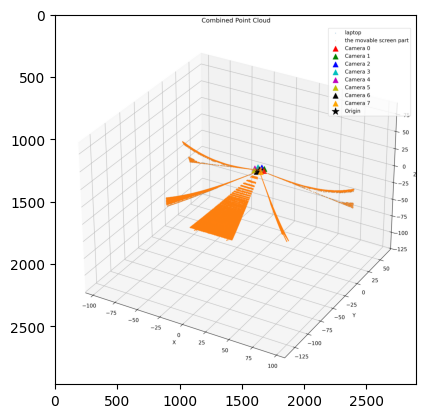

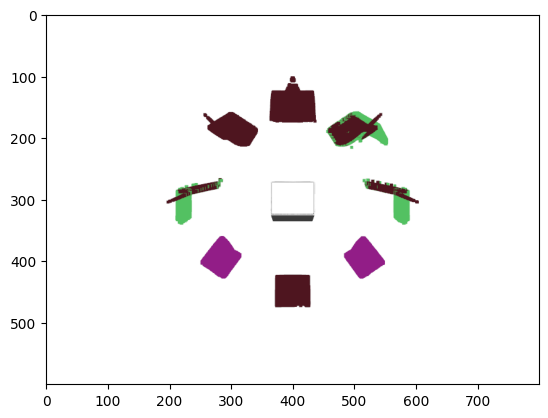

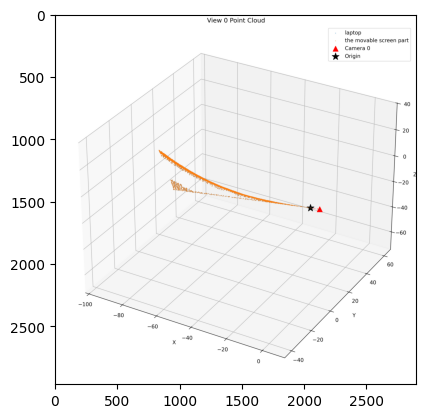

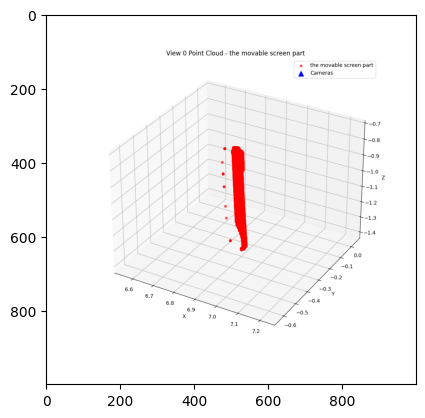

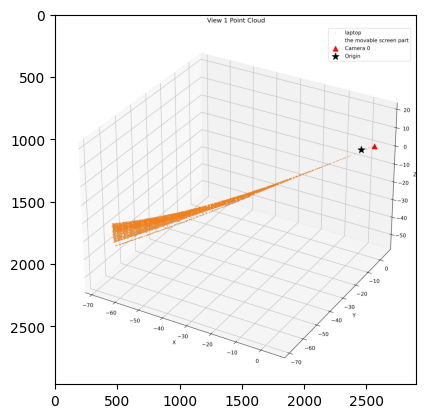

...

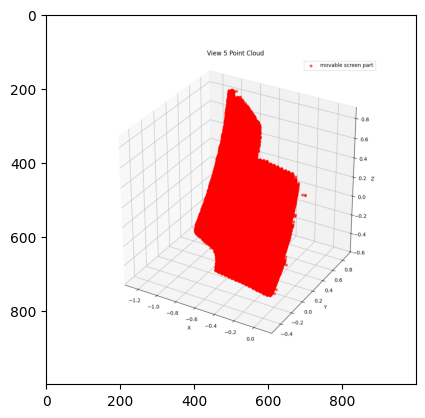

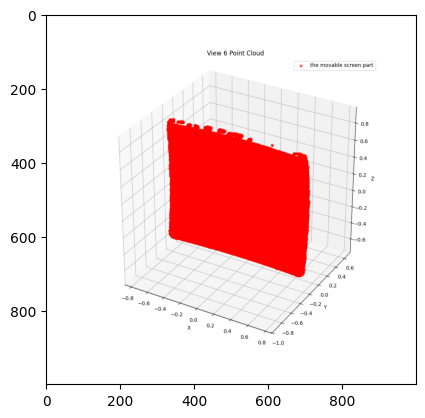

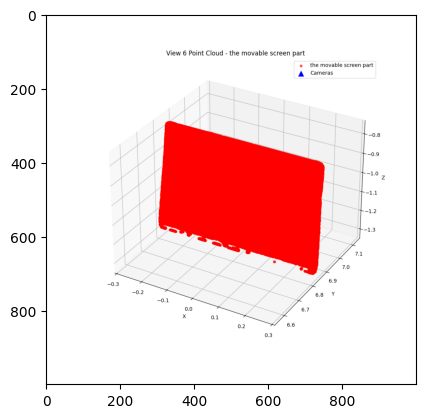

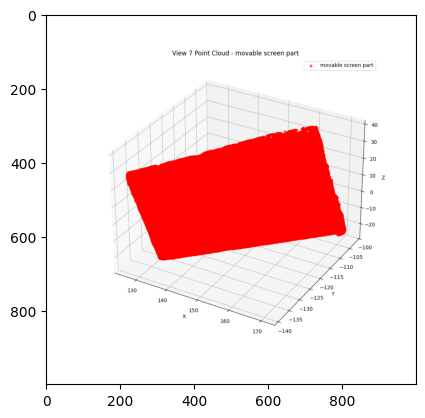

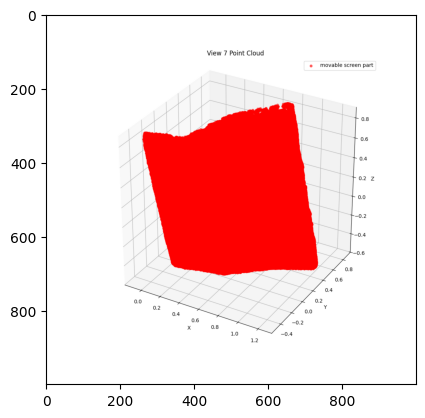

In [3]:
def visualize_generated_views(input_dir):
    """
    Display the generated views in the notebook
    """
    import matplotlib.pyplot as plt
    import cv2
    import os
    
    # Get all RGB views
    rgb_files = sorted([f for f in os.listdir(input_dir) if f.endswith('.png')])# or f.endswith('.jpg')])
    n_views = len(rgb_files)
    
    if n_views == 0:
        print("No view files found!")
        return
    
    # # Create subplot grid
    # fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    # axes = axes.ravel()
    
    for idx, filename in enumerate(rgb_files):
        # if idx >= 4:  # Only show first 4 views
        #     break
            
        filepath = os.path.join(input_dir, filename)
        img = cv2.imread(filepath)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img)
            plt.show()
            # axes[idx].imshow(img)
            # axes[idx].set_title(f'View {idx}')
            # axes[idx].axis('off')
    
    # plt.tight_layout()
    # plt.show()

# Example usage
input_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization"  # Update this path
visualize_generated_views(input_dir)

Visualizing mesh for part: laptop_real_part_0.glb
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(11759, 3), faces.shape=(23580, 3))>)])


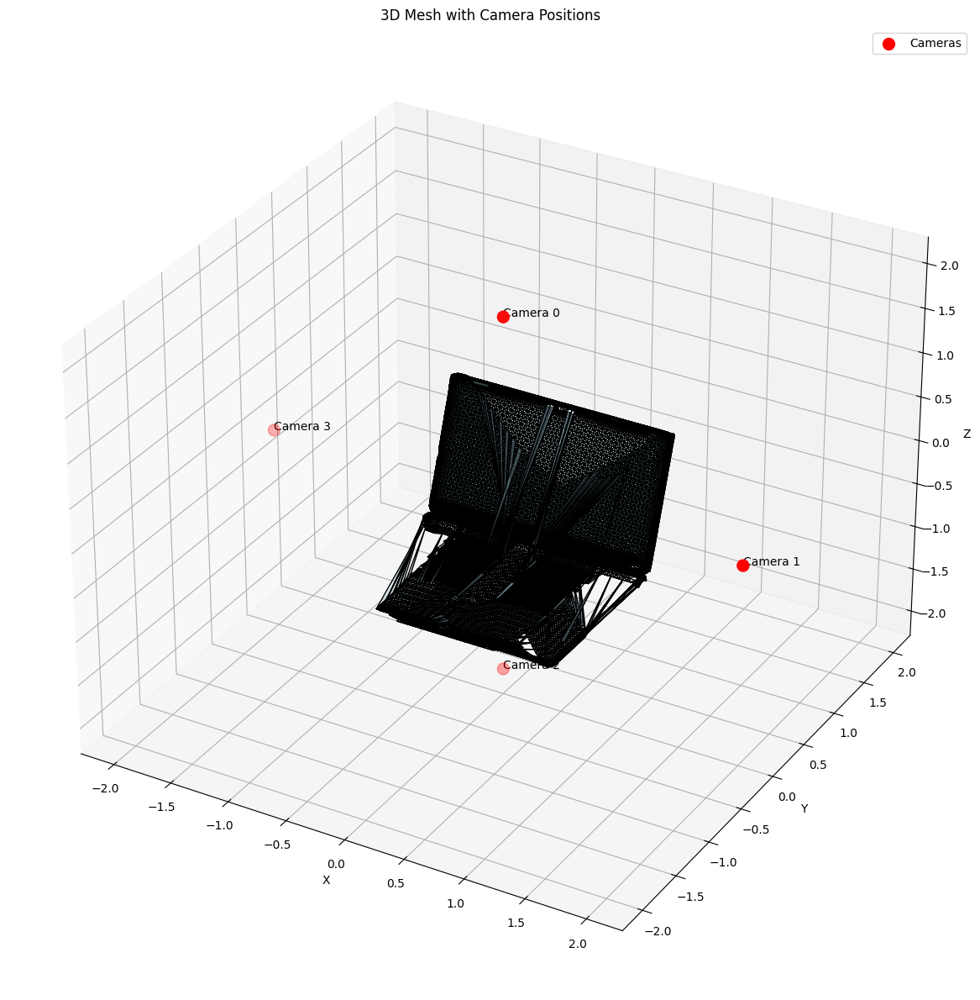

Visualizing mesh for part: laptop_real_part_2.glb
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(7082, 3), faces.shape=(14204, 3))>)])


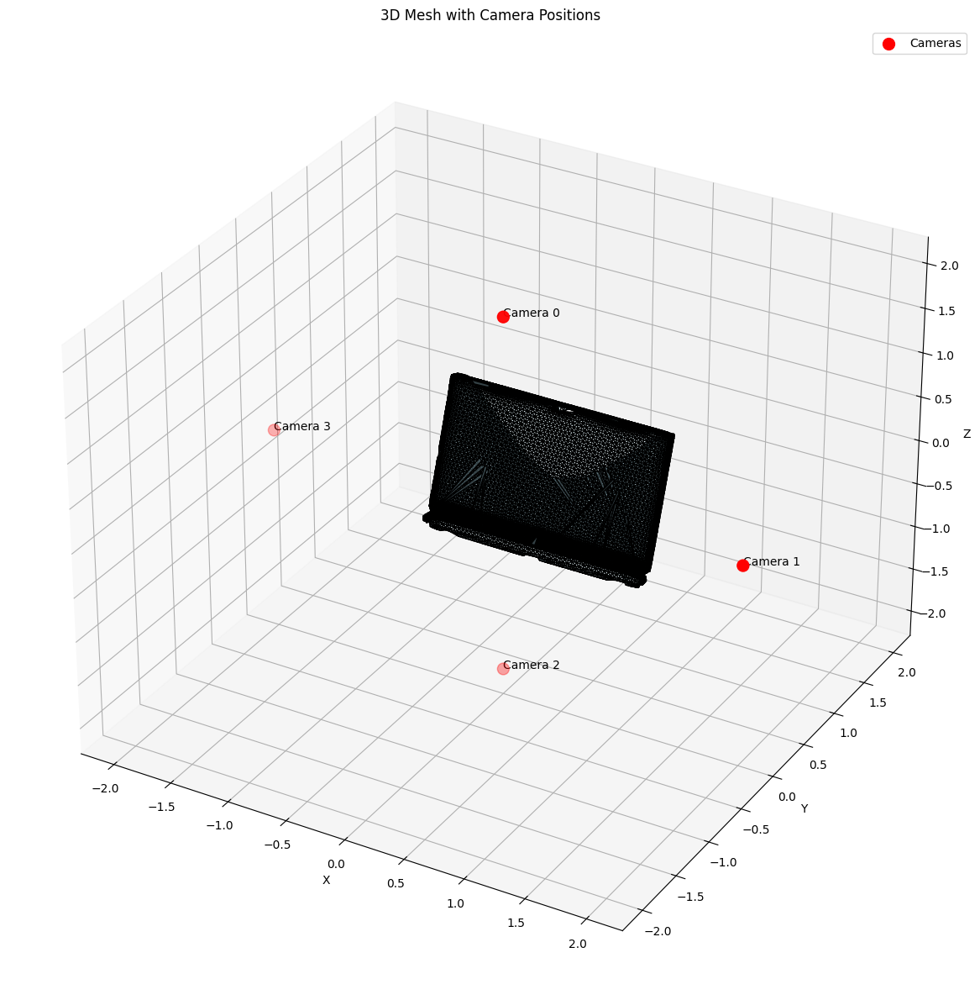

Visualizing mesh for part: laptop_real_part_1.glb
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(598, 3), faces.shape=(1196, 3))>)])


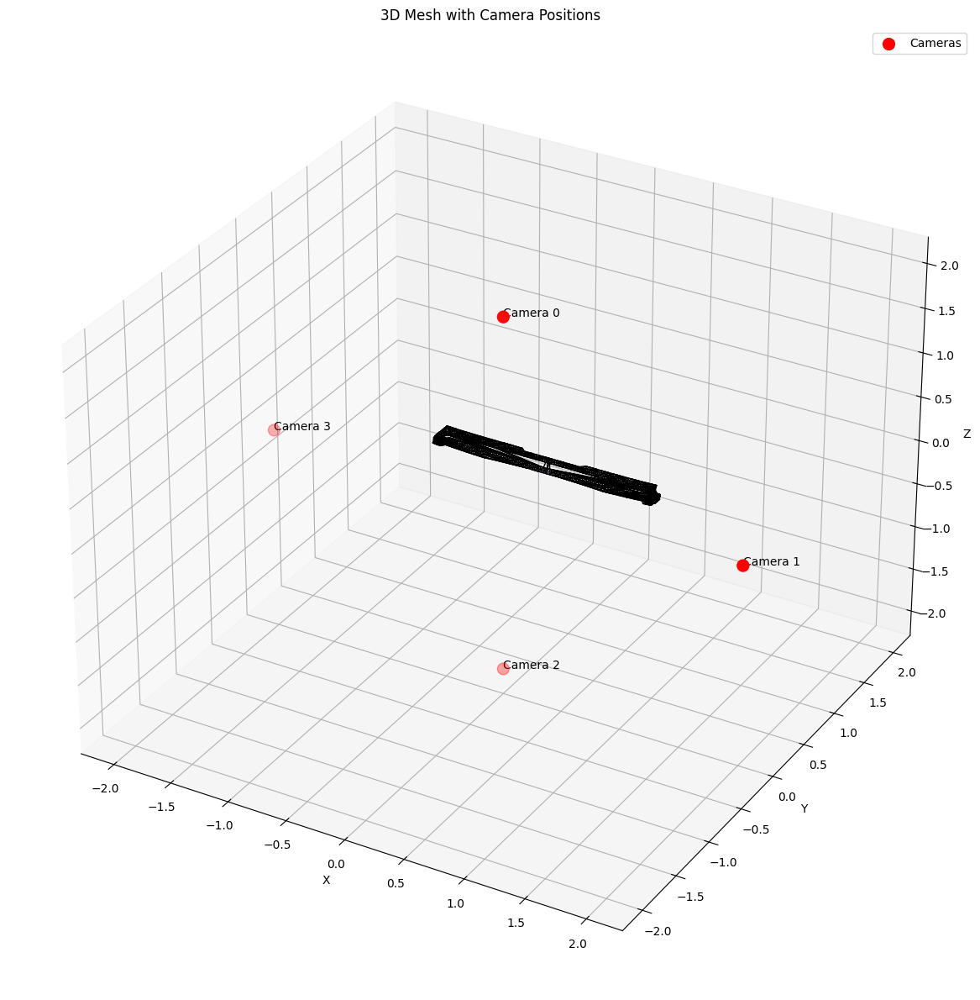

In [8]:
import os

# mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/"
mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/output"

part_names = ['geometry_0', 'geometry_0', 'geometry_0']

i = 0
for mesh in os.listdir(mesh_path_):
    if mesh.endswith('.glb'):
        mesh_path = os.path.join(mesh_path_, mesh)
        name = part_names[i]

        print(f"Visualizing mesh for part: {mesh}")

        visualize_cameras_vscode(mesh_path, name)
        i += 1

In [1]:
import os

# mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/"
mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/drawer_rodin/output"

part_names = ['geometry_0', 'geometry_0', 'geometry_0']

i = 0
for mesh in os.listdir(mesh_path_):
    if mesh.endswith('.glb'):
        mesh_path = os.path.join(mesh_path_, mesh)
        name = part_names[i]

        print(f"Visualizing mesh for part: {mesh}")

        visualize_cameras_vscode(mesh_path, name)
        i += 1

Visualizing mesh for part: drawer_rodin_part_2.glb


NameError: name 'visualize_cameras_vscode' is not defined

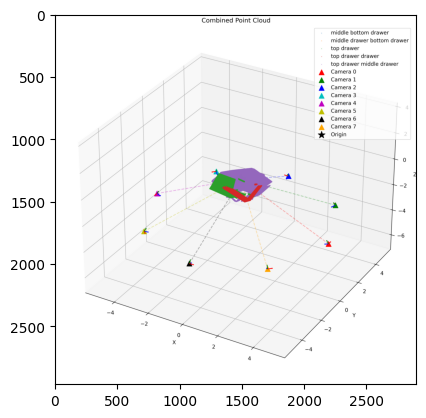

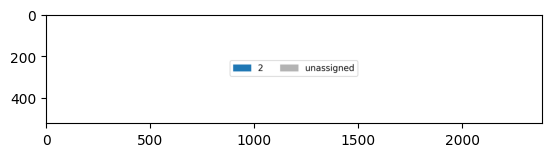

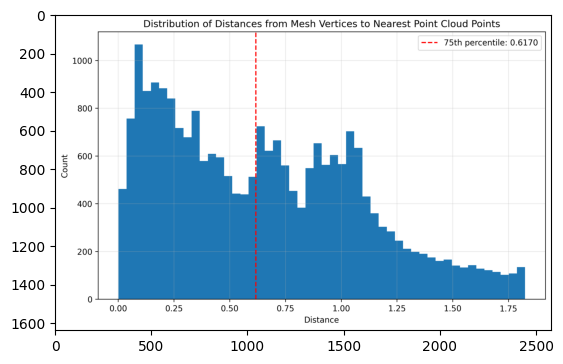

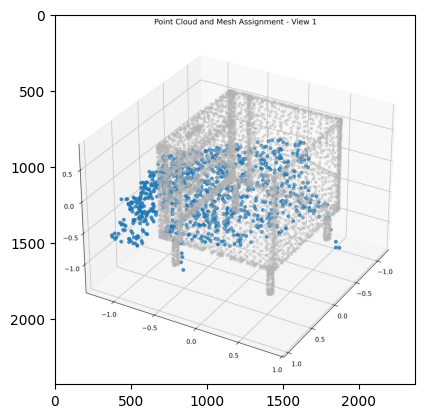

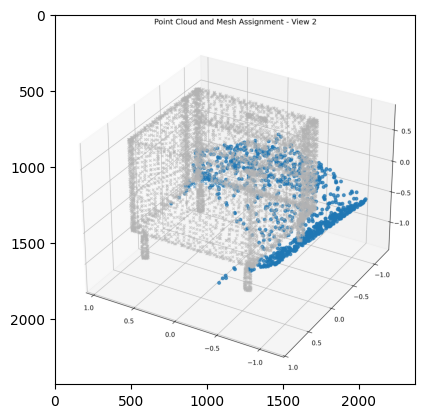

...

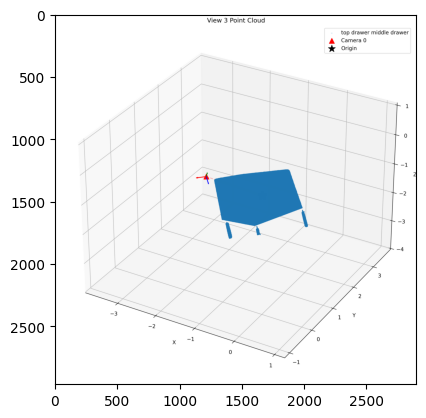

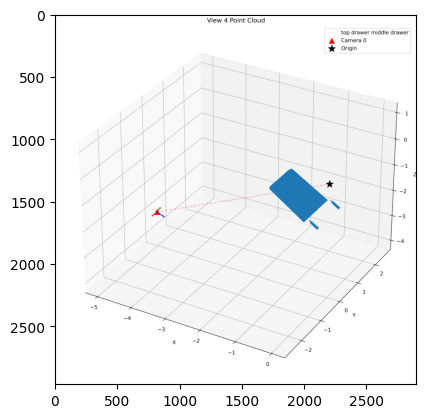

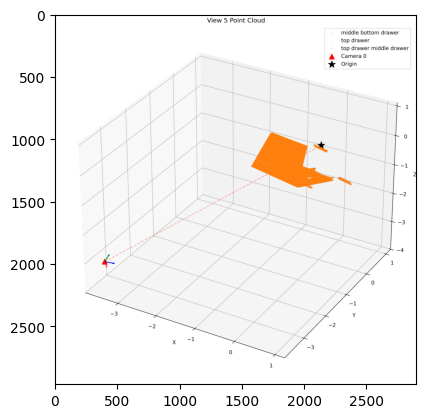

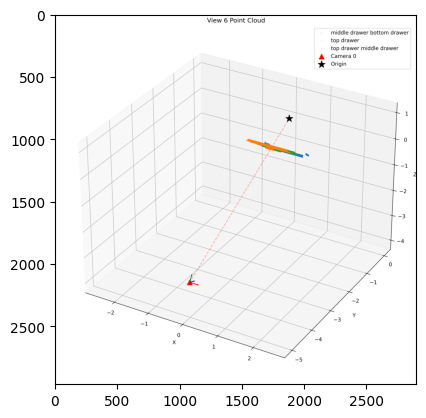

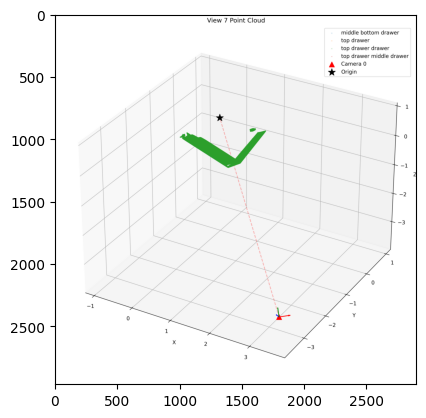

In [6]:
input_dir = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/drawer_rodin/output"  # Update this path
visualize_generated_views(input_dir)

Visualizing mesh for part: drawer_rodin_part_2.glb
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(497, 3), faces.shape=(988, 3))>)])


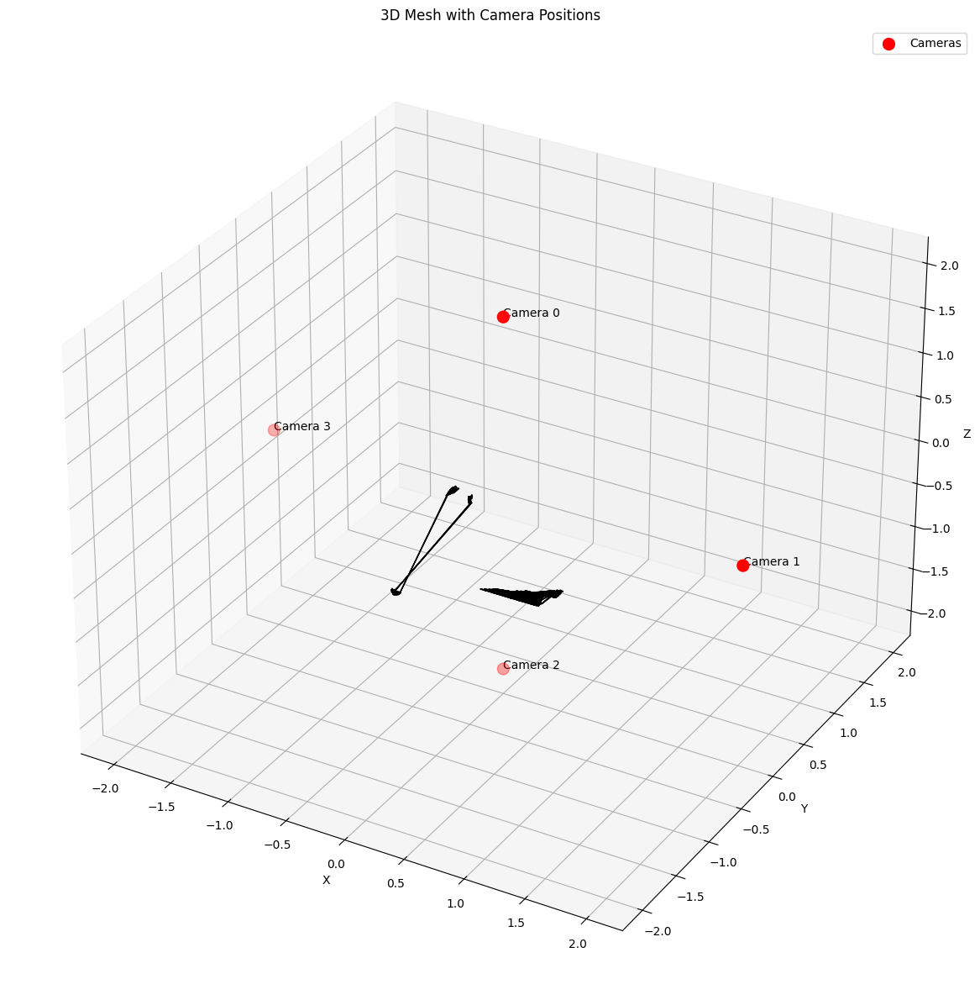

Visualizing mesh for part: drawer_rodin_part_0.glb
OrderedDict([('geometry_0', <trimesh.Trimesh(vertices.shape=(204, 3), faces.shape=(408, 3))>)])


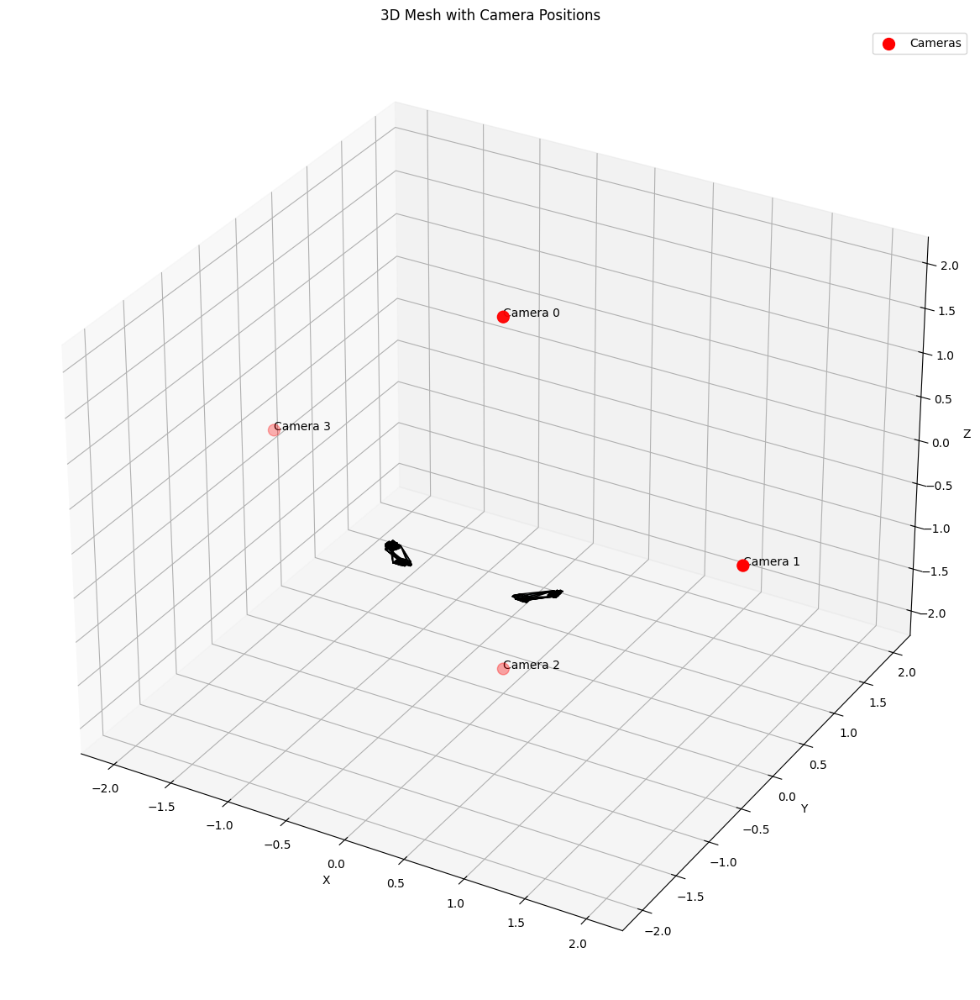

In [7]:
import os

# mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/laptop_real/visualization/"
mesh_path_ = "/home/link/DreMa/third_party/articulate-anything/datasets/segmentation_masks/drawer_rodin/output"

part_names = ['geometry_0', 'geometry_0', 'geometry_0']

i = 0
for mesh in os.listdir(mesh_path_):
    if mesh.endswith('.glb'):
        mesh_path = os.path.join(mesh_path_, mesh)
        name = part_names[i]

        print(f"Visualizing mesh for part: {mesh}")

        visualize_cameras_vscode(mesh_path, name)
        i += 1

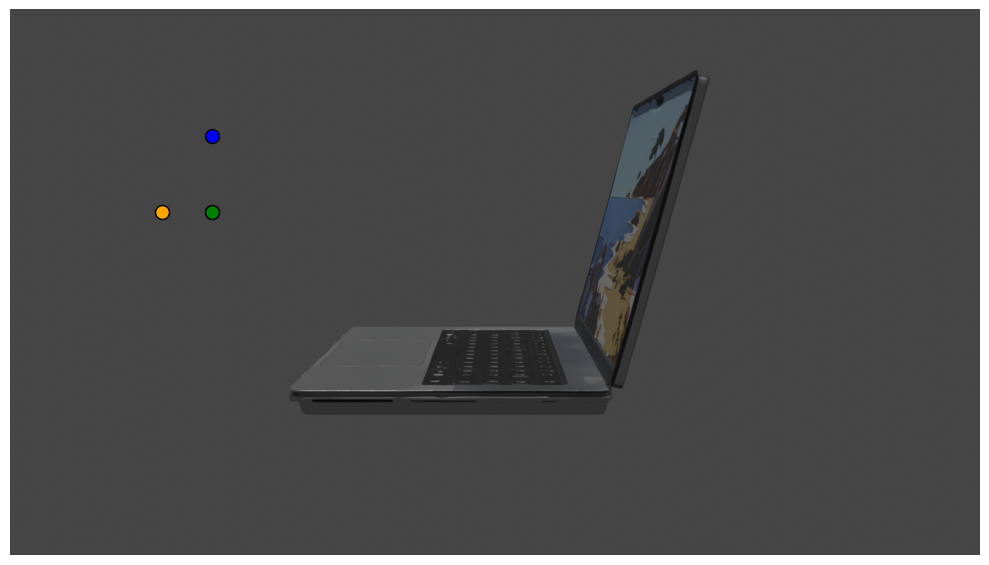

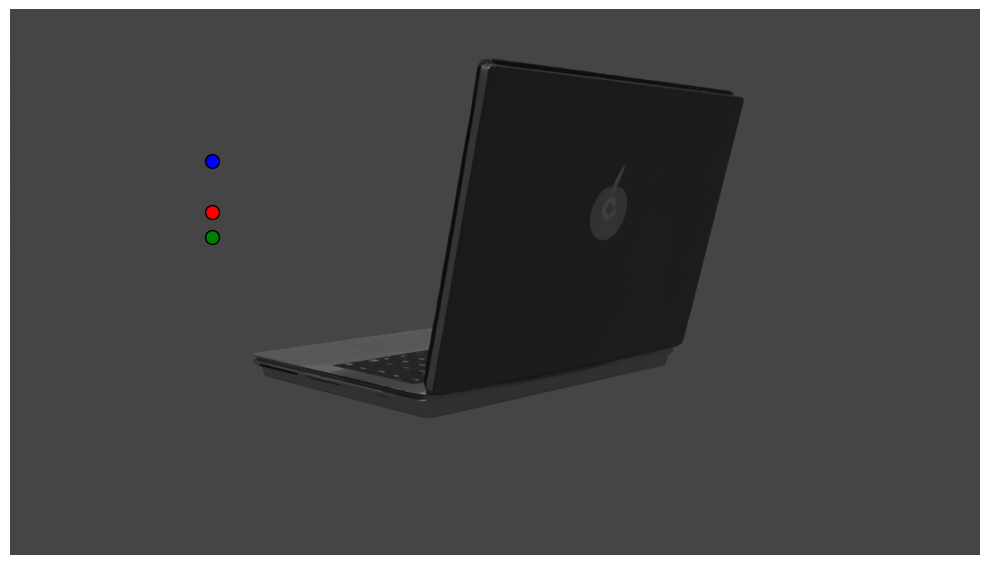

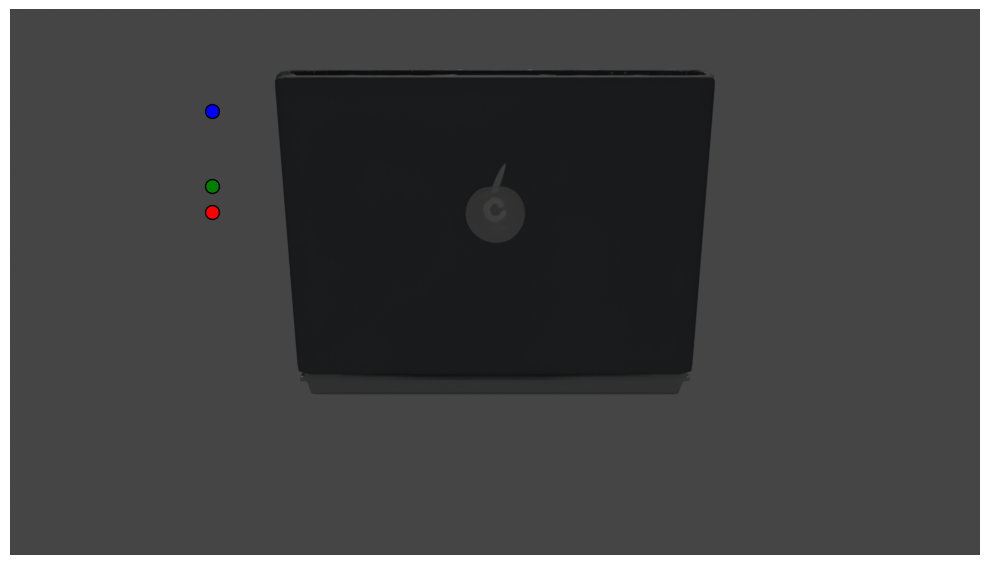

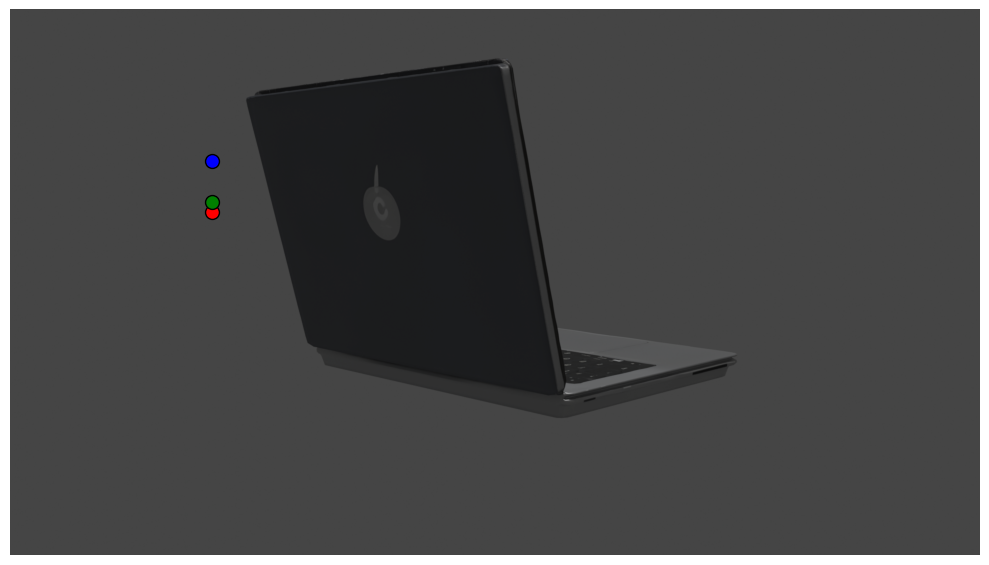

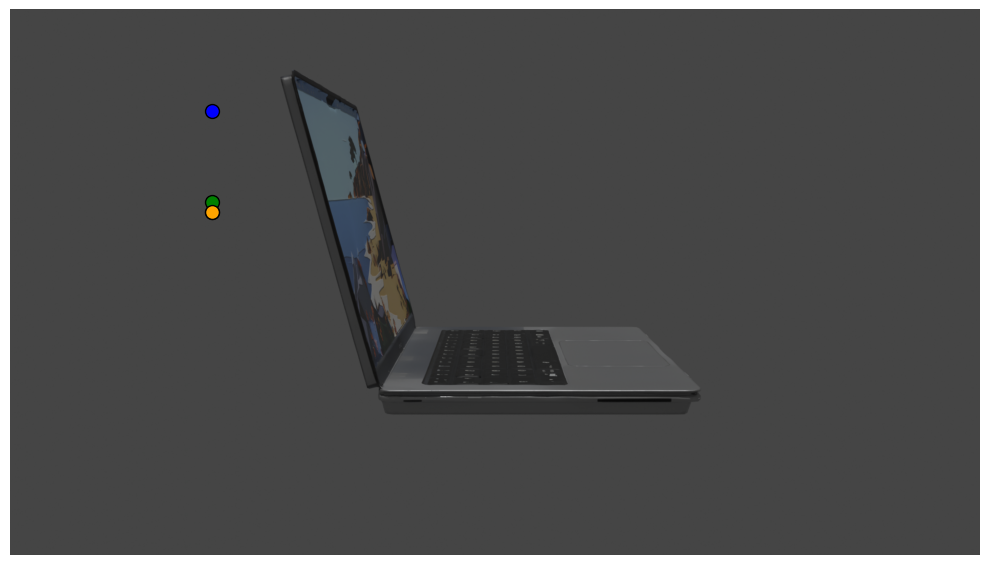

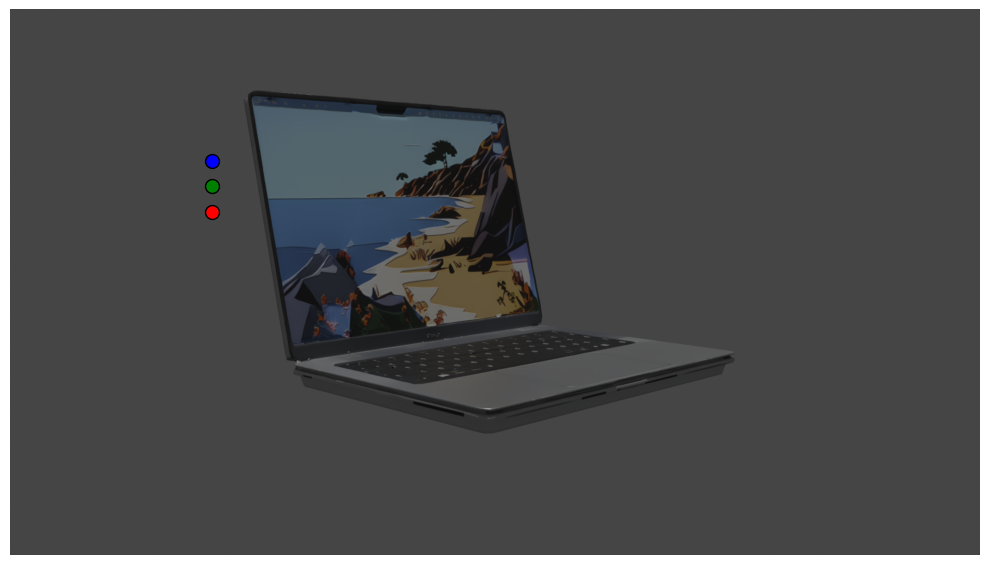

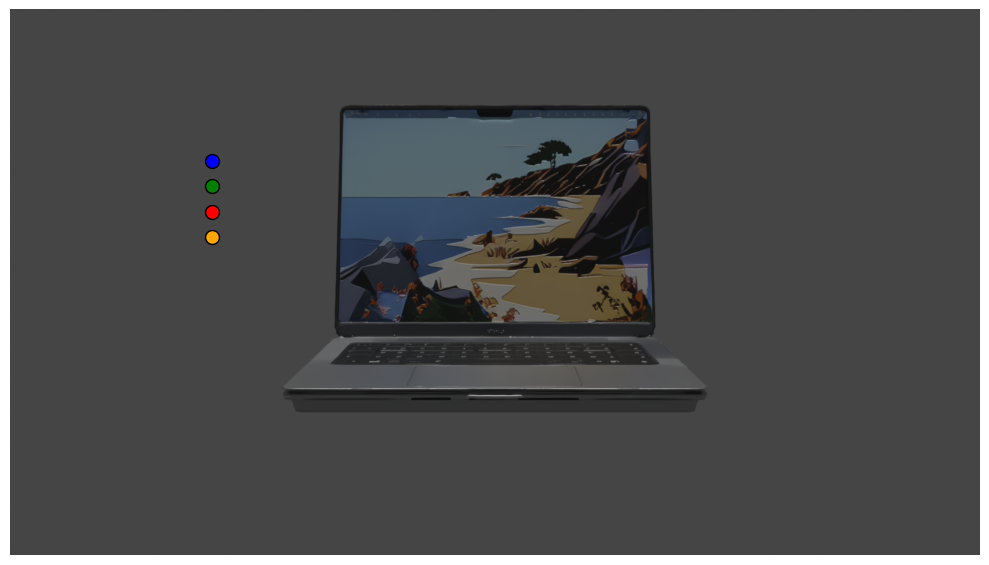

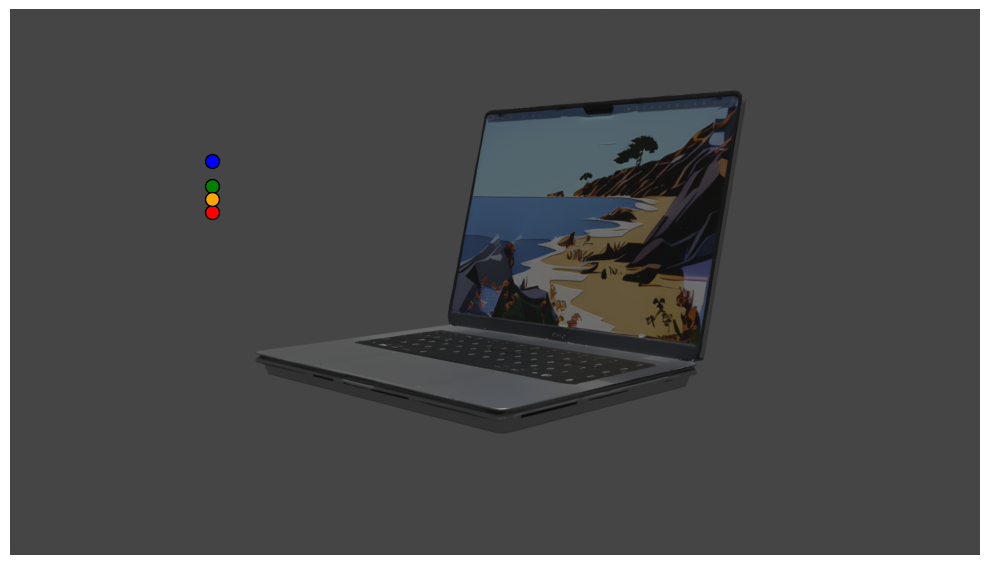

In [12]:
import os
import json
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import matplotlib.colors as mcolors

def plot_images_with_points(image_dir, points_dir, output_dir=None, OBJECT='laptop_real'):
    """
    Load images and their corresponding points, then plot them together.
    
    Args:
        image_dir: Directory containing image files
        points_dir: Directory containing point coordinate files (JSON format)
        output_dir: Directory to save the output plots (optional)
    """
    # Create output directory if specified
    if not output_dir:
        output_dir = os.path.join(image_dir, 'points')
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Get all image files
    image_files = sorted([os.path.join(input_path, f) for f in os.listdir(input_path) 
                        if f.startswith(f"render_{OBJECT}") and f.endswith(".png")])
    
    colors = [
        'red', 'blue', 'green', 'orange', 'purple', 
        'cyan', 'magenta', 'yellow', 'lime', 'pink',
        'brown', 'gray', 'olive', 'teal', 'navy'
    ]
    
    # Load points
    with open(points_dir, 'r') as f:
        all_points = json.load(f)
    
    for i, img_file in enumerate(image_files):
        # Load image
        img_path = os.path.join(image_dir, img_file)
        image = np.array(Image.open(img_path))
        
        # Create figure
        plt.figure(figsize=(10, 8))
        
        # # Display image
        plt.imshow(image)

        points = all_points[i]
        points = [[float(p[0]), float(p[1])] for p in points]
        
        # Extract x and y coordinates
        x_coords = [point[0] for point in points]
        y_coords = [point[1] for point in points]
        
        # Plot points
        # plt.scatter(x_coords, y_coords, c='red', s=50, marker='o')

        
        # Plot points with different colors
        for j, (x, y) in enumerate(zip(x_coords, y_coords)):
            color = colors[j % len(colors)]  # Cycle through colors
            plt.scatter(x, y, c=color, s=100, marker='o', edgecolors='black')
            # plt.text(x+10, y+10, str(i), fontsize=12, color='white', 
            #          bbox=dict(facecolor=color, alpha=0.7))
        
        
        # plt.title(f"Image: {img_file} with Points")
        plt.axis('off')
        
        # Save or show the plot
        plt.savefig(os.path.join(output_dir, f"{OBJECT}_with_points_{i}.png"))
        plt.tight_layout()
        plt.show()


OBJECT = 'laptop_real'
input_path = f"/home/link/DreMa/third_party/articulate-anything/datasets/output_views/{OBJECT}"
points_path = os.path.join(input_path, f'articulated_points.json')
    
plot_images_with_points(input_path, points_path, OBJECT=OBJECT)

Found 10 .ply files
Processing mesh_1.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/mesh_1.0.ply...
Mesh has 18586 triangles. Plotting a subset of 5000 for performance.


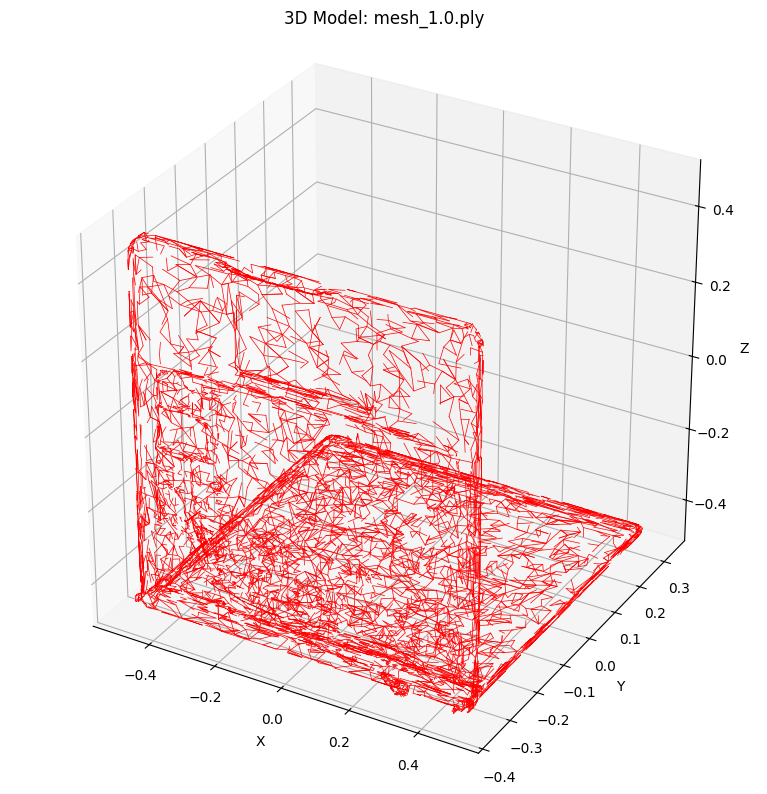

Processing 0.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/0.0.ply...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).


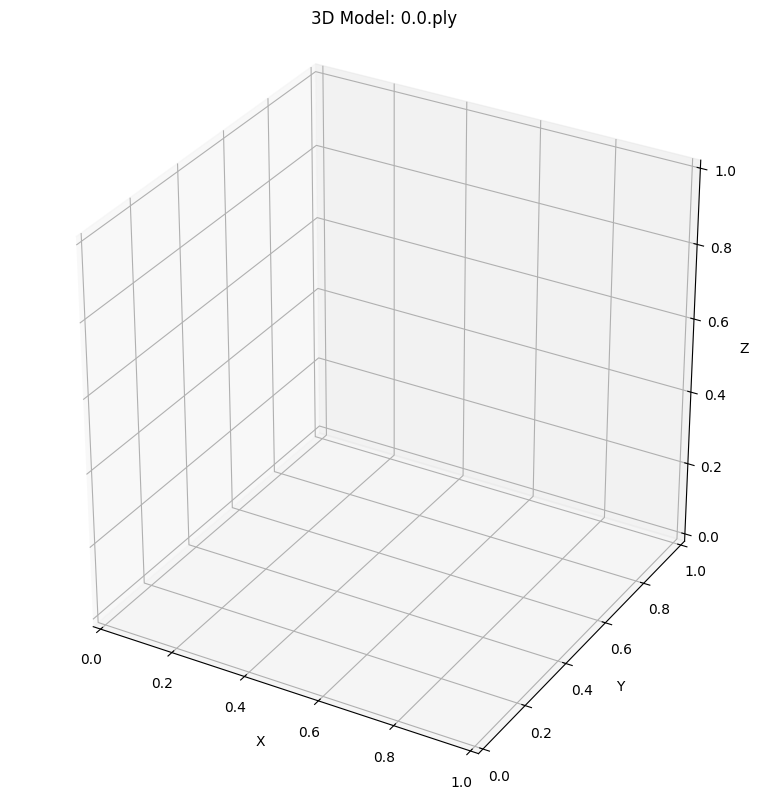

Processing mesh_0.5.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/mesh_0.5.ply...
Mesh has 18586 triangles. Plotting a subset of 5000 for performance.


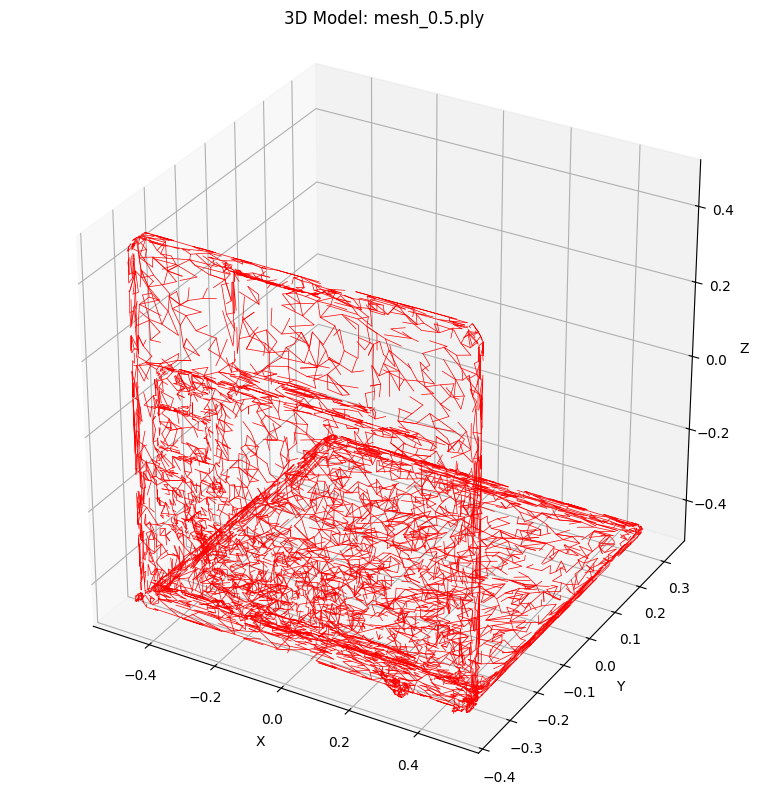

Processing 1.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/1.0.ply...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).


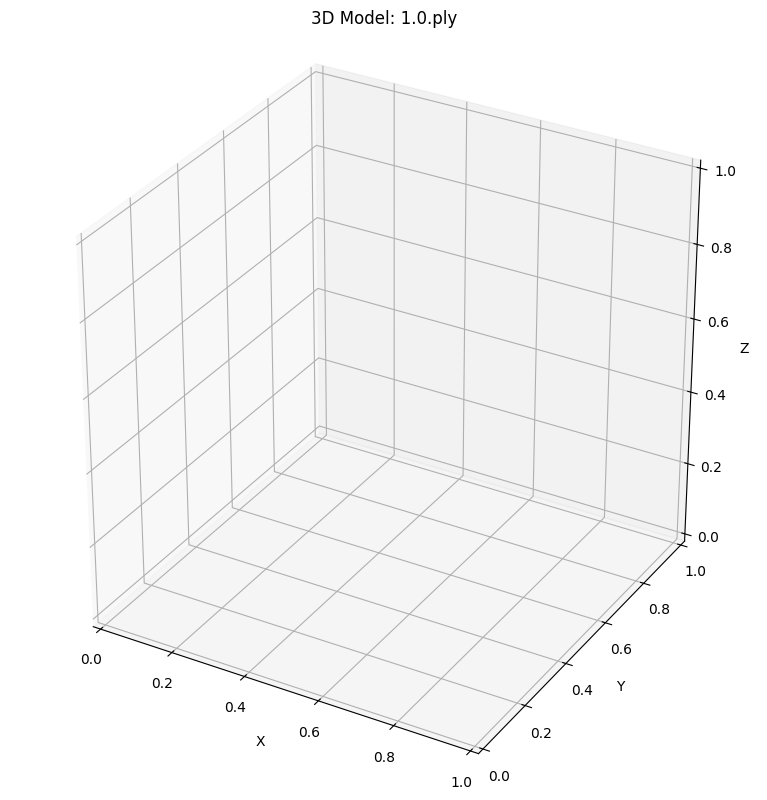

Processing mesh_1.5.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/mesh_1.5.ply...
Mesh has 18586 triangles. Plotting a subset of 5000 for performance.


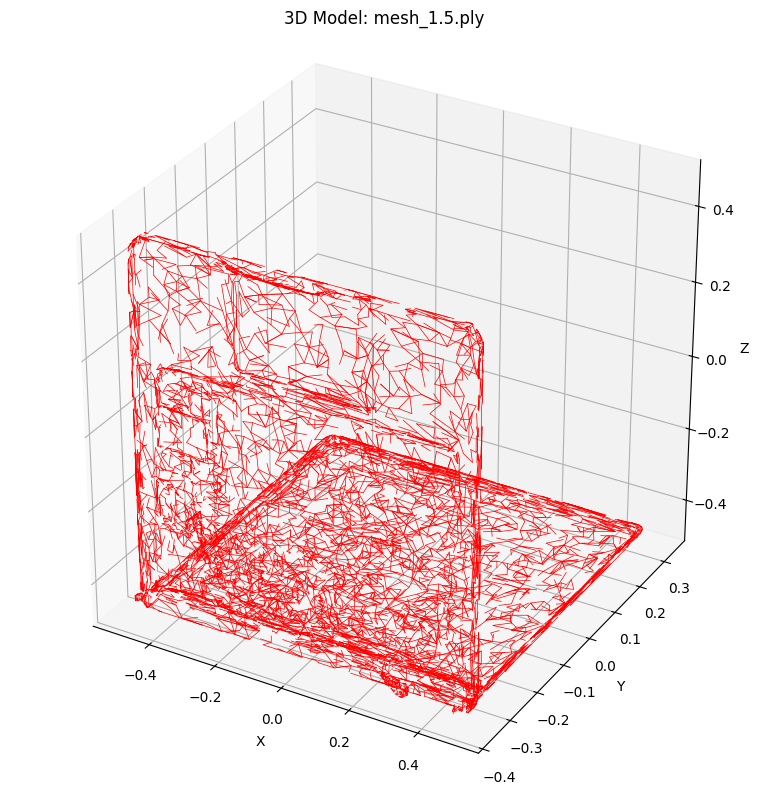

Processing 1.5.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/1.5.ply...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).


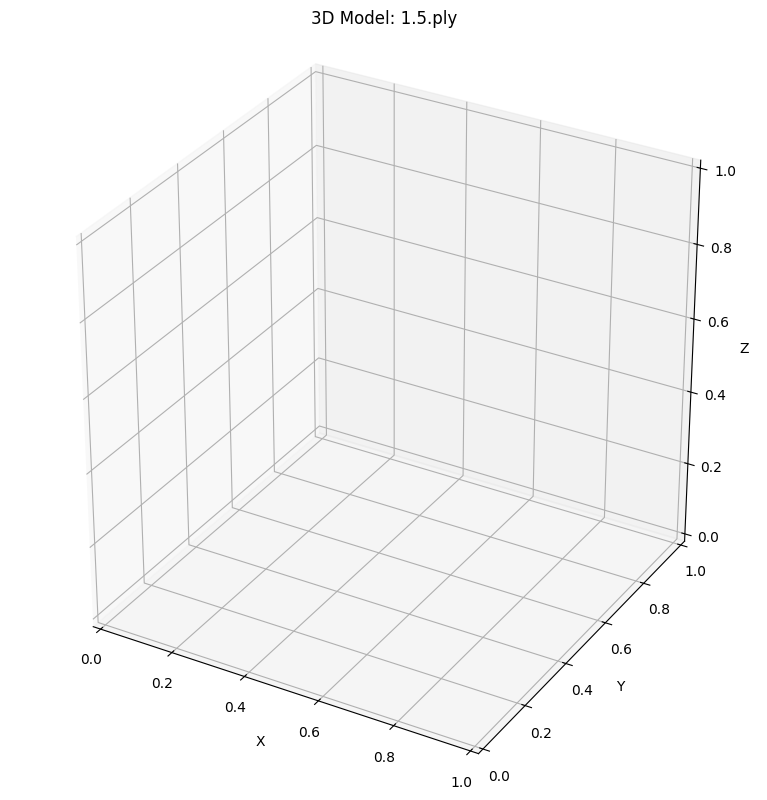

Processing 0.5.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/0.5.ply...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).


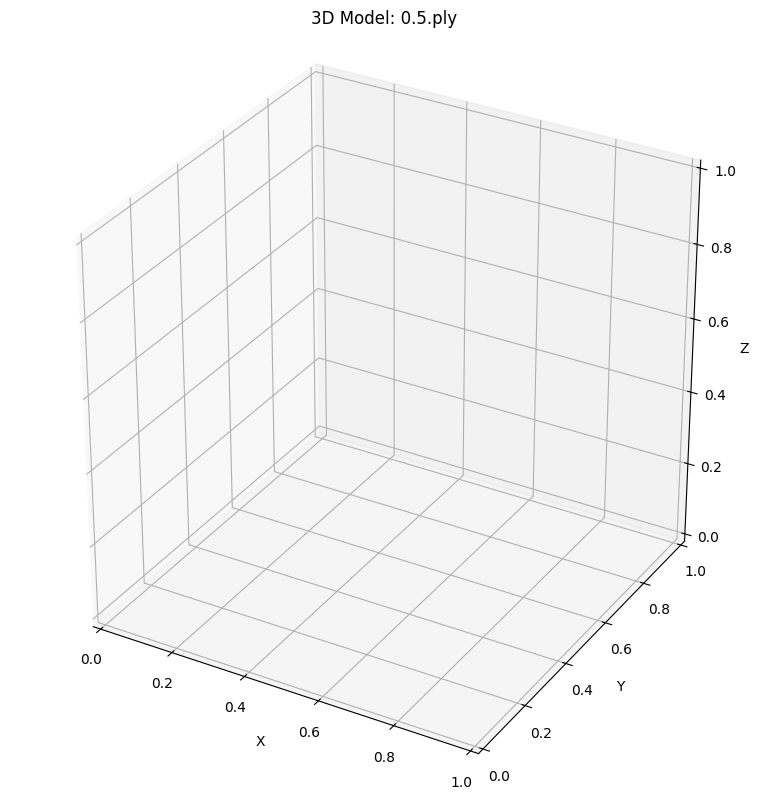

Processing 2.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/2.0.ply...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).


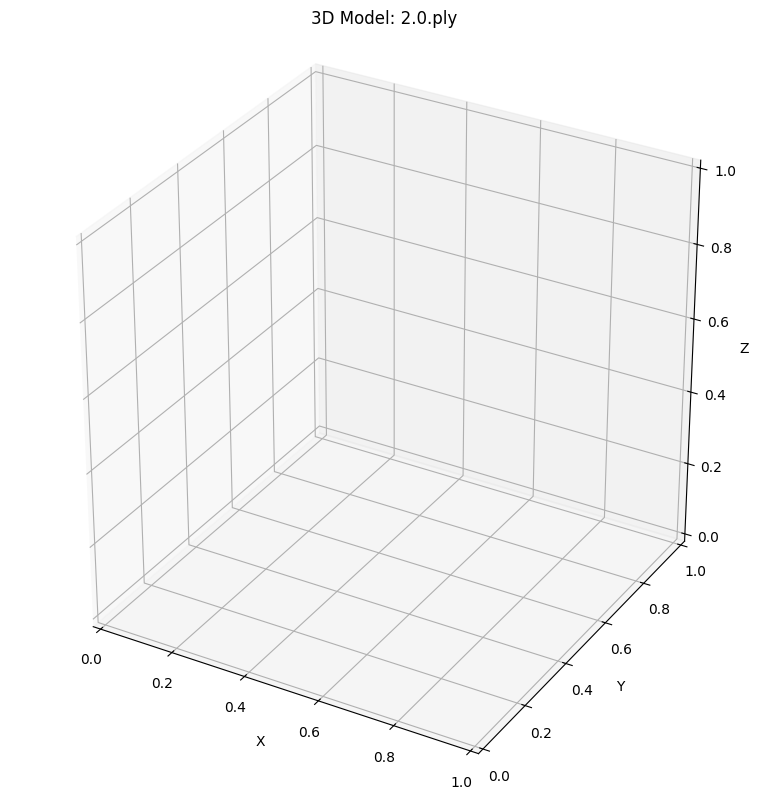

Processing mesh_0.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/mesh_0.0.ply...
Mesh has 18586 triangles. Plotting a subset of 5000 for performance.


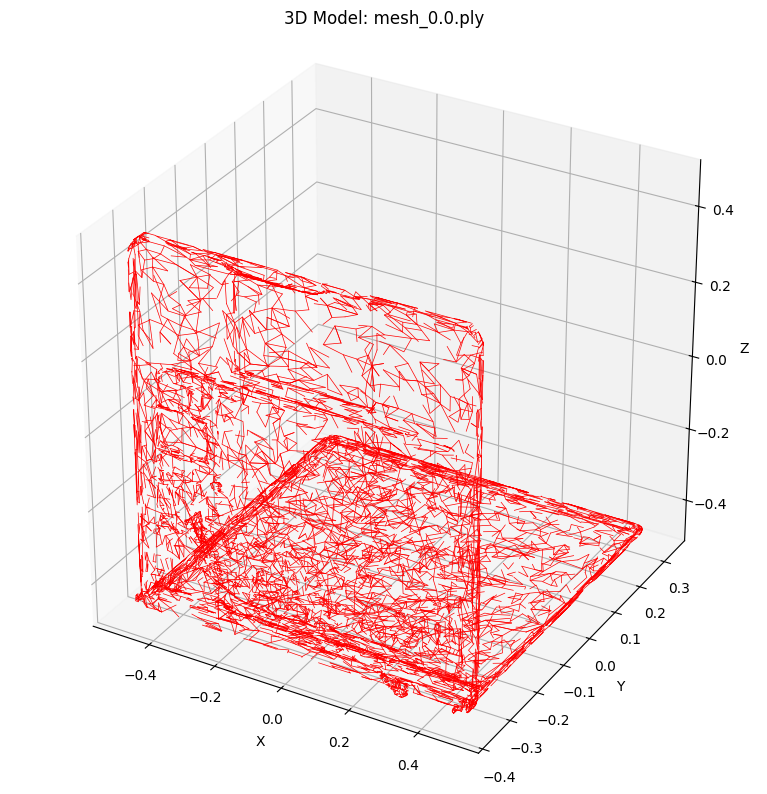

Processing mesh_2.0.ply...
Loading /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last/mesh_2.0.ply...
Mesh has 18586 triangles. Plotting a subset of 5000 for performance.


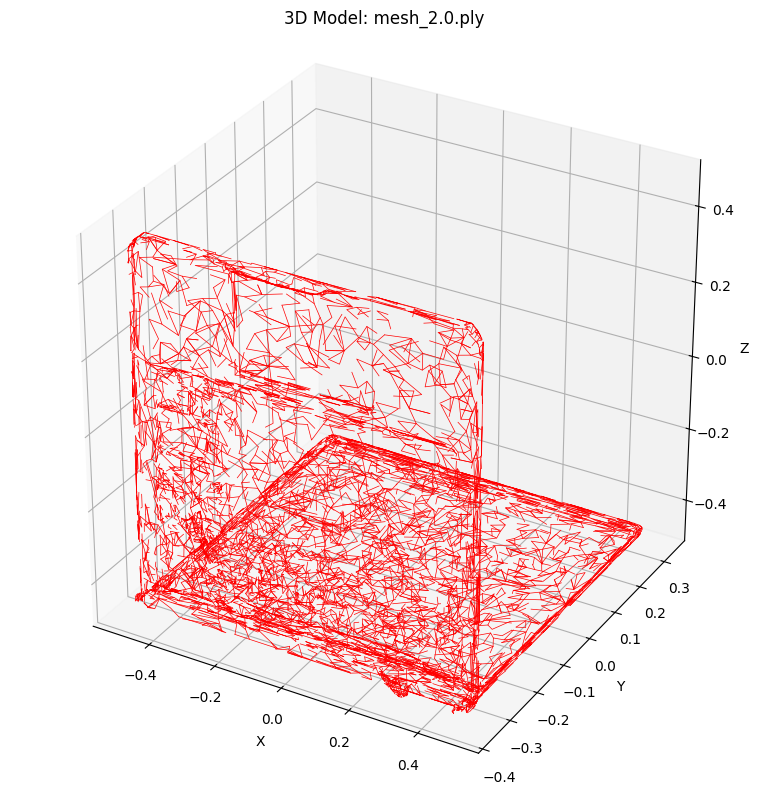

In [6]:
import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import glob

def plot_ply_with_matplotlib(file_path):
    """Plot a PLY file using matplotlib"""
    print(f"Loading {file_path}...")
    mesh = o3d.io.read_triangle_mesh(file_path)
    vertices = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # For better performance, plot a subset of triangles if the mesh is very large
    max_triangles_to_plot = 5000  # Adjust this based on your performance needs
    if len(triangles) > max_triangles_to_plot:
        print(f"Mesh has {len(triangles)} triangles. Plotting a subset of {max_triangles_to_plot} for performance.")
        indices = np.random.choice(len(triangles), max_triangles_to_plot, replace=False)
        triangles_subset = triangles[indices]
    else:
        triangles_subset = triangles
    
    # Plot the triangles
    for triangle in triangles_subset:
        x = vertices[triangle, 0]
        y = vertices[triangle, 1]
        z = vertices[triangle, 2]
        ax.plot(x, y, z, 'r-', linewidth=0.5)
    
    # Alternative: plot as a wireframe or surface
    # This can be more efficient for some meshes
    # ax.plot_trisurf(vertices[:, 0], vertices[:, 1], vertices[:, 2], 
    #                triangles=triangles, alpha=0.5, color='gray')
    
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'3D Model: {os.path.basename(file_path)}')
    
    # Set equal aspect ratio
    ax.set_box_aspect([1, 1, 1])
    
    plt.tight_layout()
    return fig

def process_ply_file(file_path):
    """Process a single PLY file"""
    fig = plot_ply_with_matplotlib(file_path)
    plt.show()

def process_all_ply_files(directory_path):
    """Process all PLY files in the given directory"""
    ply_files = glob.glob(os.path.join(directory_path, "*.ply"))
    
    if not ply_files:
        print(f"No .ply files found in {directory_path}")
        return
    
    print(f"Found {len(ply_files)} .ply files")
    
    for file_path in ply_files:
        print(f"Processing {os.path.basename(file_path)}...")
        fig = plot_ply_with_matplotlib(file_path)
        plt.show()


directory_path = "/home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/vis_pcd/last"
process_all_ply_files(directory_path)

Found 5 segmentation files

Visualizing mesh_0.0.npy...
Loading mesh from /home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb
Mesh has 19986 vertices and 35776 faces
Loading segmentation from /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/mesh_0.0.npy
Segmentation has shape (18586,)
Assuming segmentation applies to the first subset of faces
Found 15 unique parts


/tmp/ipykernel_90031/3062922151.py:19: DeprecationWarning: `Scene.dump(concatenate=True)` DEPRECATED FOR REMOVAL APRIL 2025: replace with `Scene.to_geometry()`
  mesh = mesh.dump(concatenate=True)
/tmp/ipykernel_90031/3062922151.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', max(20, num_parts))


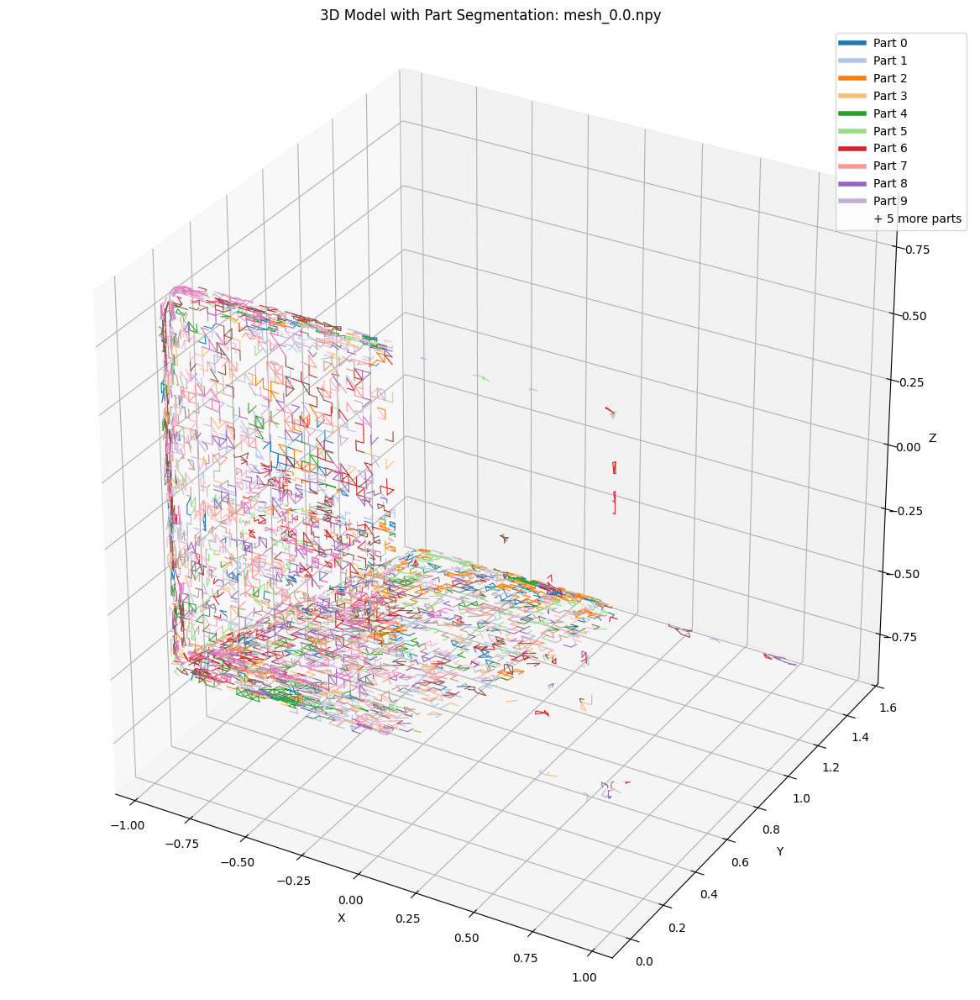


Visualizing mesh_0.5.npy...
Loading mesh from /home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb
Mesh has 19986 vertices and 35776 faces
Loading segmentation from /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/mesh_0.5.npy
Segmentation has shape (18586,)
Assuming segmentation applies to the first subset of faces
Found 7 unique parts


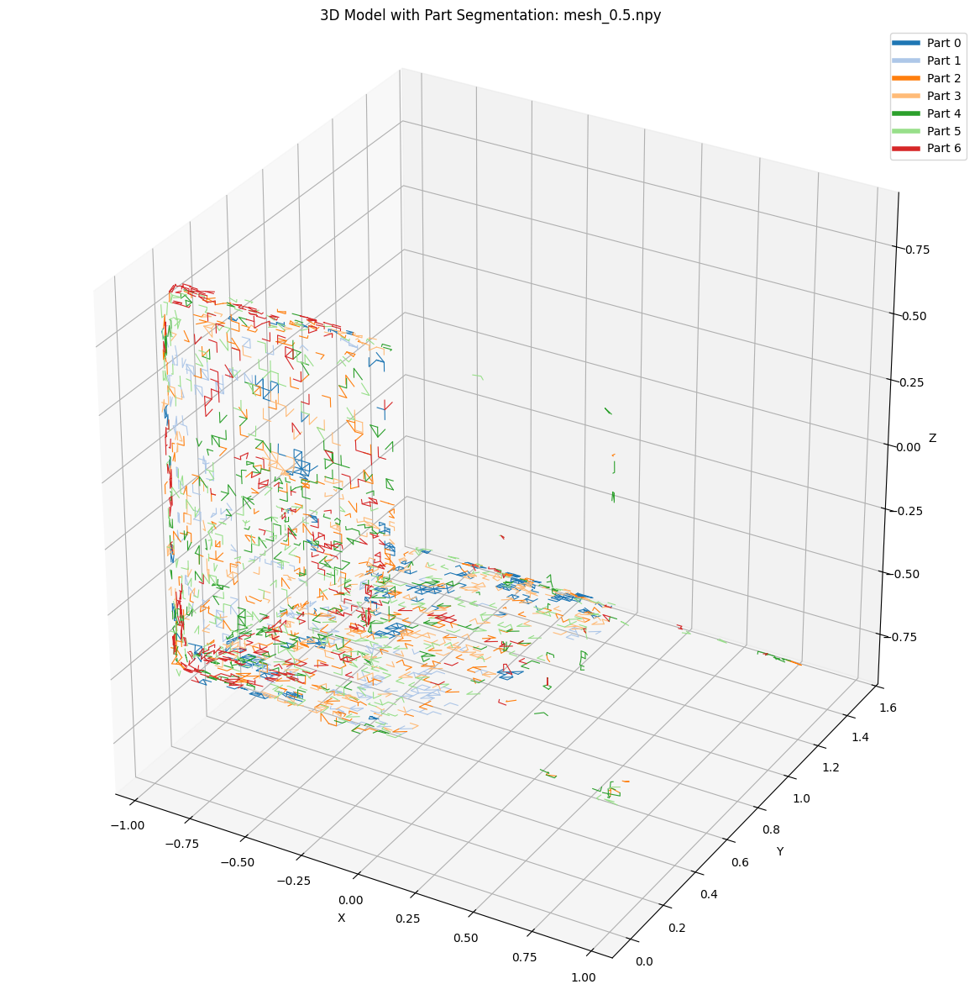


Visualizing mesh_1.0.npy...
Loading mesh from /home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb
Mesh has 19986 vertices and 35776 faces
Loading segmentation from /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/mesh_1.0.npy
Segmentation has shape (18586,)
Assuming segmentation applies to the first subset of faces
Found 2 unique parts


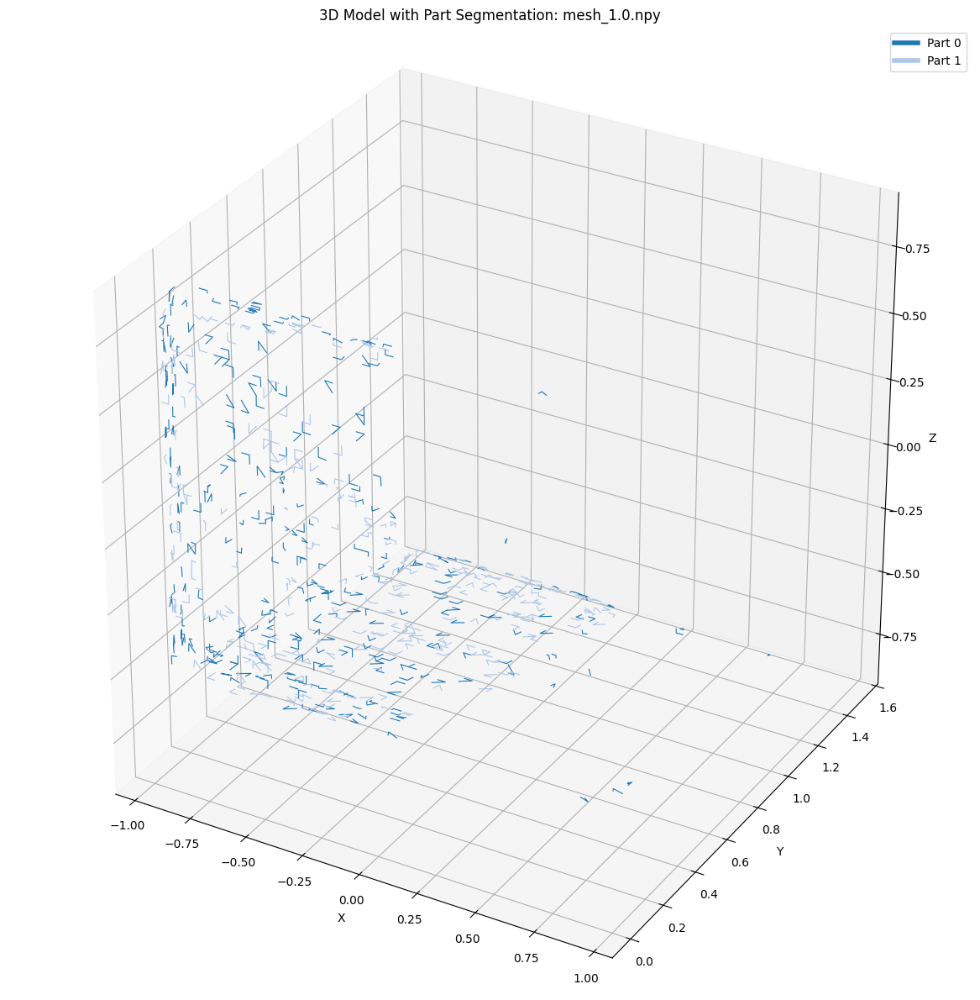


Visualizing mesh_1.5.npy...
Loading mesh from /home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb
Mesh has 19986 vertices and 35776 faces
Loading segmentation from /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/mesh_1.5.npy
Segmentation has shape (18586,)
Assuming segmentation applies to the first subset of faces
Found 2 unique parts


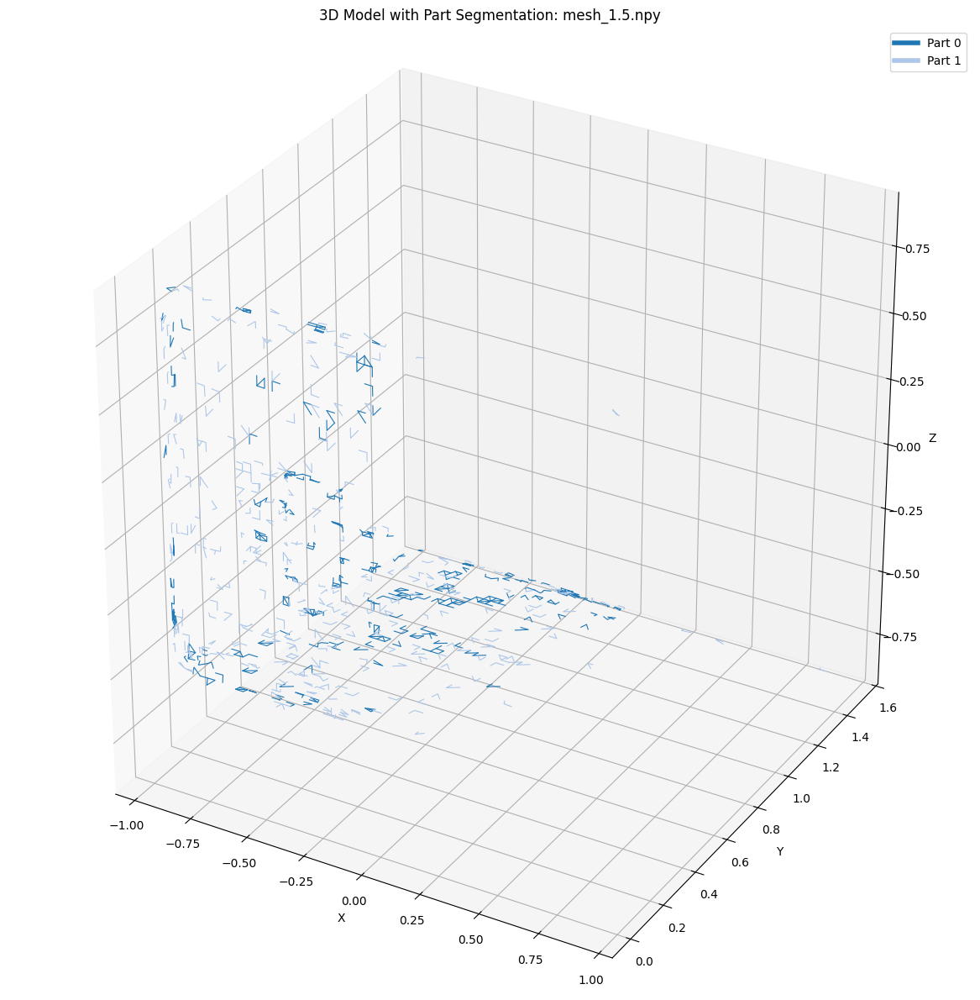


Visualizing mesh_2.0.npy...
Loading mesh from /home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb
Mesh has 19986 vertices and 35776 faces
Loading segmentation from /home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/mesh_2.0.npy
Segmentation has shape (18586,)
Assuming segmentation applies to the first subset of faces
Found 2 unique parts


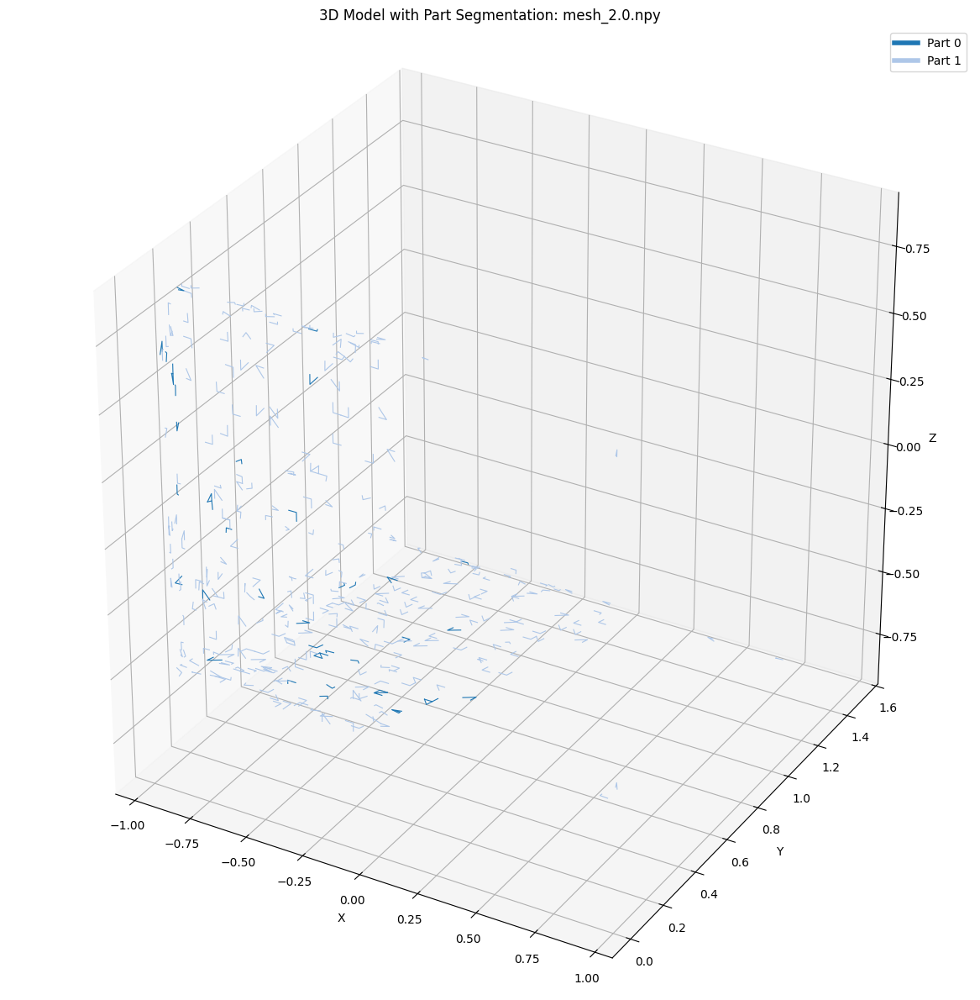

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import trimesh
import os
import glob

def visualize_segmented_mesh(mesh_path, segmentation_path):
    """
    Visualize a mesh with part segmentation from a .npy file
    
    Args:
        mesh_path: Path to the original mesh file (.glb, .obj, etc.)
        segmentation_path: Path to the .npy file containing part IDs
    """
    print(f"Loading mesh from {mesh_path}")
    mesh = trimesh.load(mesh_path)
    if isinstance(mesh, trimesh.Scene):
        mesh = mesh.dump(concatenate=True)
    
    print(f"Mesh has {len(mesh.vertices)} vertices and {len(mesh.faces)} faces")
    
    print(f"Loading segmentation from {segmentation_path}")
    part_ids = np.load(segmentation_path)
    print(f"Segmentation has shape {part_ids.shape}")
    
    # Check if the segmentation matches the number of faces
    if len(part_ids) != len(mesh.faces):
        print(f"Warning: Number of segmentation IDs ({len(part_ids)}) doesn't match number of faces ({len(mesh.faces)})")
        print("Assuming segmentation applies to the first subset of faces")
    
    # Get unique part IDs
    unique_parts = np.unique(part_ids)
    num_parts = len(unique_parts)
    print(f"Found {num_parts} unique parts")
    
    # Create a colormap for the parts
    cmap = plt.cm.get_cmap('tab20', max(20, num_parts))
    
    # Create figure
    fig = plt.figure(figsize=(15, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot each part with a different color
    for i, part_id in enumerate(unique_parts):
        # Get faces for this part
        part_face_indices = np.where(part_ids == part_id)[0]
        if len(part_face_indices) == 0:
            continue
            
        # Sample faces if there are too many for performance
        max_faces_to_plot = 300  # Reduced for better performance
        if len(part_face_indices) > max_faces_to_plot:
            part_face_indices = np.random.choice(part_face_indices, max_faces_to_plot, replace=False)
        
        # Get color for this part
        color = cmap(i % 20)  # Use modulo to handle more than 20 parts
        
        # Plot each face in this part
        for idx in part_face_indices:
            if idx < len(mesh.faces):
                face = mesh.faces[idx]
                vertices = mesh.vertices[face]
                x = vertices[:, 0]
                y = vertices[:, 1]
                z = vertices[:, 2]
                ax.plot(x, y, z, color=color, linewidth=0.8)
    
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'3D Model with Part Segmentation: {os.path.basename(segmentation_path)}')
    
    # Set equal aspect ratio
    ax.set_box_aspect([1, 1, 1])
    
    # Add a legend
    from matplotlib.lines import Line2D
    # Limit legend to first 10 parts if there are many
    legend_parts = unique_parts[:10] if len(unique_parts) > 10 else unique_parts
    legend_elements = [Line2D([0], [0], color=cmap(i % 20), lw=4, label=f'Part {part_id}')
                      for i, part_id in enumerate(legend_parts)]
    if len(unique_parts) > 10:
        legend_elements.append(Line2D([0], [0], color='black', lw=0, label=f'+ {len(unique_parts)-10} more parts'))
    ax.legend(handles=legend_elements, loc='upper right')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def visualize_all_segmentations(mesh_path, results_dir):
    """Visualize all segmentation files in the results directory"""
    # Find all mesh_*.npy files
    segmentation_files = glob.glob(os.path.join(results_dir, "mesh_*.npy"))
    
    if not segmentation_files:
        print(f"No segmentation files found in {results_dir}")
        return
    
    print(f"Found {len(segmentation_files)} segmentation files")
    
    for seg_file in sorted(segmentation_files):
        print(f"\nVisualizing {os.path.basename(seg_file)}...")
        visualize_segmented_mesh(mesh_path, seg_file)



# Example usage
mesh_path = "/home/link/DreMa/third_party/SAMPart3D/mesh_root/laptop_real.glb"  # Update this path to your mesh file
segmentation_path = "/home/link/DreMa/third_party/SAMPart3D/exp/sampart3d/laptop_real/results/last/"  # Update this path to your .npy file

visualize_all_segmentations(mesh_path, segmentation_path)


## separate meshes

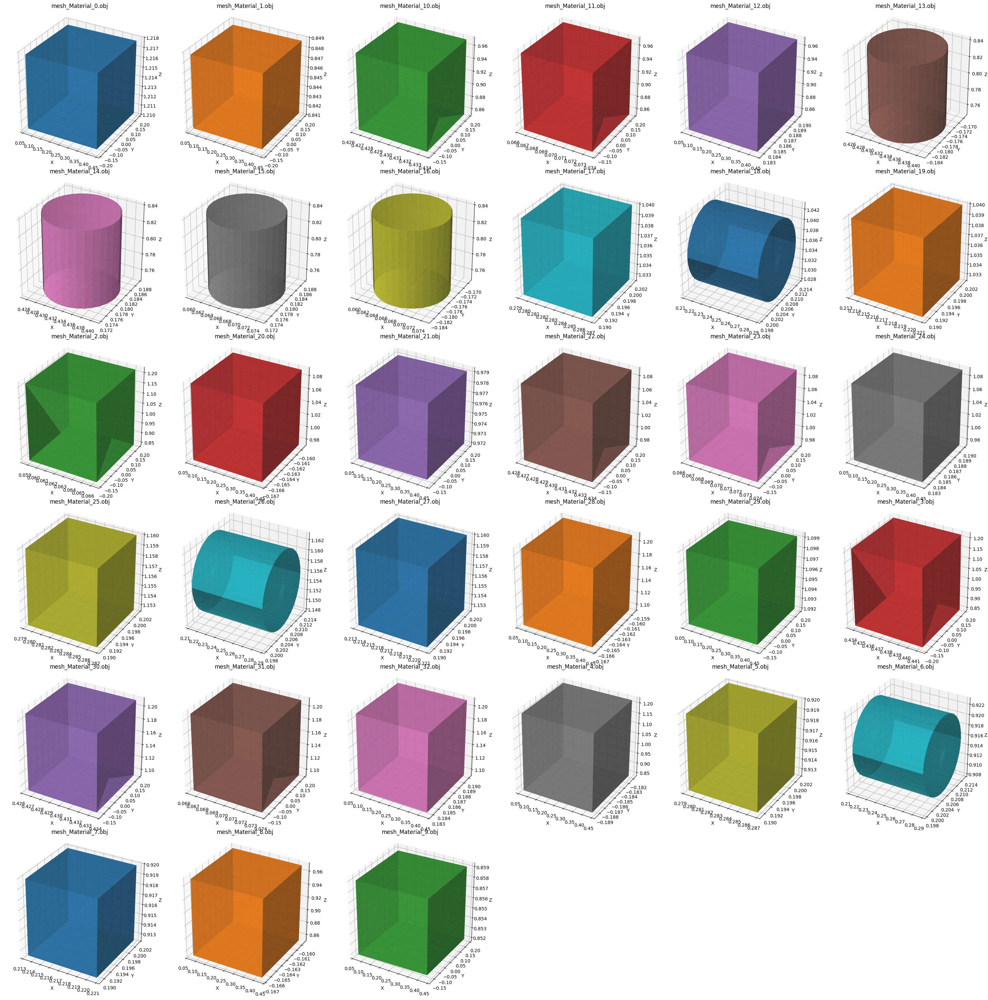

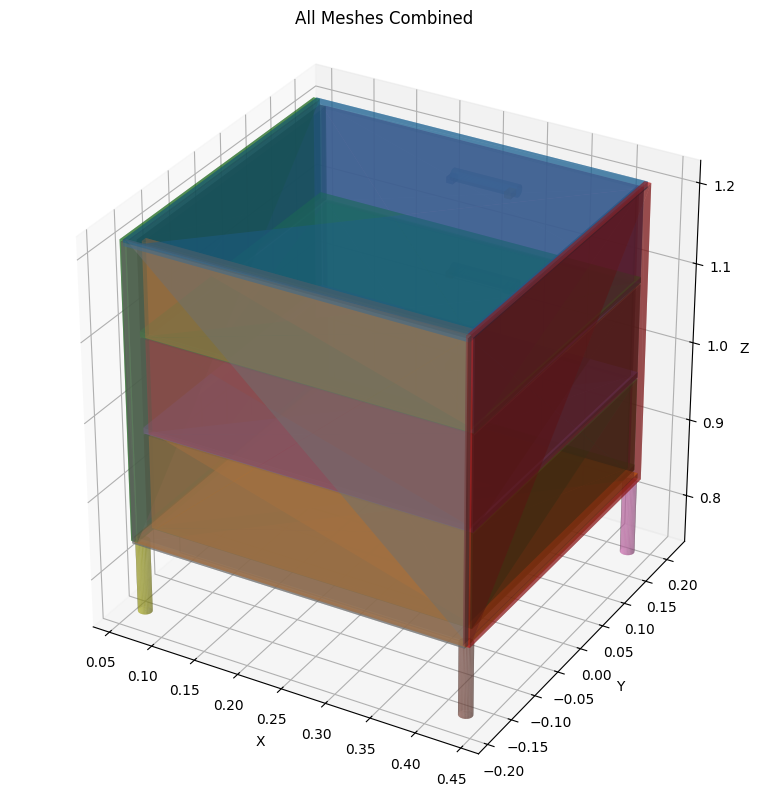

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import glob

def load_obj(file_path):
    """Load an OBJ file and return vertices and faces."""
    vertices = []
    faces = []
    
    with open(file_path, 'r') as f:
        for line in f:
            if line.startswith('v '):  # Vertex
                parts = line.strip().split()
                vertices.append([float(parts[1]), float(parts[2]), float(parts[3])])
            elif line.startswith('f '):  # Face
                parts = line.strip().split()[1:]
                # Extract just the vertex indices (ignoring texture/normal indices)
                face_vertices = []
                for part in parts:
                    # Handle different face formats (v, v/vt, v/vt/vn, v//vn)
                    vertex_idx = int(part.split('/')[0]) - 1  # OBJ indices start at 1
                    face_vertices.append(vertex_idx)
                faces.append(face_vertices)
    
    return np.array(vertices), faces

def plot_obj(file_path, ax=None, color='blue', alpha=0.7):
    """Plot an OBJ file on the given matplotlib 3D axis."""
    if ax is None:
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
    
    vertices, faces = load_obj(file_path)
    
    # Plot each face as a polygon
    for face in faces:
        # Get the vertices for this face
        face_vertices = vertices[face]
        
        # Plot the face
        ax.plot_trisurf(face_vertices[:, 0], face_vertices[:, 1], face_vertices[:, 2], 
                        color=color, alpha=alpha, shade=True)
    
    # Set the title to the filename
    ax.set_title(os.path.basename(file_path))
    
    # Set equal aspect ratio
    ax.set_box_aspect([1, 1, 1])
    
    return ax

# Find all extracted mesh files
mesh_files = sorted(glob.glob("/home/link/DreMa/third_party/articulate-anything/datasets/output_views/drawer_rodin/separate_meshes/mesh_Material_*.obj"))

if not mesh_files:
    print("No mesh files found. Make sure to run the extraction script first.")
else:
    # Plot each mesh in a separate subplot
    num_meshes = len(mesh_files)
    rows = int(np.ceil(np.sqrt(num_meshes)))
    cols = int(np.ceil(num_meshes / rows))
    
    fig = plt.figure(figsize=(cols*5, rows*5))
    
    # Define a list of colors for different meshes
    colors = plt.cm.tab10.colors
    
    for i, mesh_file in enumerate(mesh_files):
        ax = fig.add_subplot(rows, cols, i+1, projection='3d')
        plot_obj(mesh_file, ax=ax, color=colors[i % len(colors)])
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
    
    plt.tight_layout()
    plt.show()
    
    # Also create a combined view of all meshes
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    for i, mesh_file in enumerate(mesh_files):
        plot_obj(mesh_file, ax=ax, color=colors[i % len(colors)], alpha=0.5)
    
    ax.set_title("All Meshes Combined")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_box_aspect([1, 1, 1])
    
    plt.tight_layout()
    plt.show()

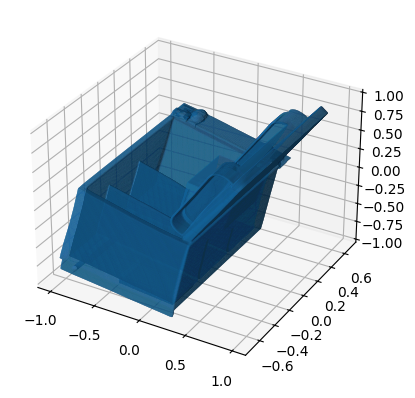

In [1]:
import trimesh
import matplotlib.pyplot as plt

scene = trimesh.load("/home/link/Downloads/meshes/fridge/start/multiview.glb")
geometries = list(scene.geometry.values())
trim = geometries[0]


fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.plot_trisurf(trim.vertices[:, 0], trim.vertices[:,1], trim.vertices[:,2], triangles=trim.faces);

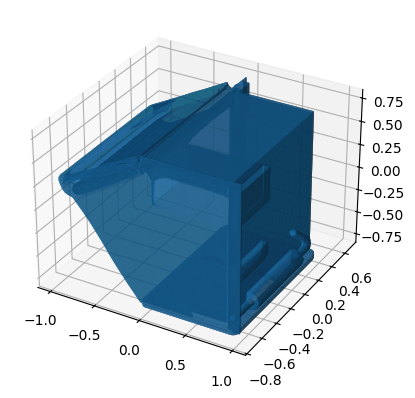

In [2]:
import trimesh
import matplotlib.pyplot as plt

scene = trimesh.load("/home/link/Downloads/meshes/fridge/end/multiview.glb")
geometries = list(scene.geometry.values())
trim = geometries[0]


fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.plot_trisurf(trim.vertices[:, 0], trim.vertices[:,1], trim.vertices[:,2], triangles=trim.faces);